# GO and Pathway Analysis 

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

def insert_newlines(string, every=10):
    words = string.split()
    lines = [' '.join(words[i:i+every]) for i in range(0, len(words), every)]
    return '\n'.join(lines)

def plot_go_terms(df, regulation_type, max_log_pvalue, top_n=20):
    title = f"Top {top_n} Significant GO Terms for {regulation_type} Genes"
    significant_df = df[df['qvalue'] < 0.05].sort_values('qvalue').head(top_n)
    
    if significant_df.empty:
        print(f"No significant GO terms found for {regulation_type} genes.")
        return
    
    significant_df.reset_index(drop=True, inplace=True)
    significant_df['-log10(qvalue)'] = -np.log10(significant_df['qvalue'])
    
    fig, ax = plt.subplots(figsize=(10, 40), dpi=150)
    barplot = sns.barplot(data=significant_df, y='ID', x='-log10(qvalue)',
                          palette='Greens_r', edgecolor='.2', linewidth=1.5, ax=ax)
    
    ax.set_xlim(0, max_log_pvalue + 1)

    for index, row in significant_df.iterrows():
        description = insert_newlines(f"Description: {row['Description']}; ")
        count = f"Count: {row['Count']}; "
        genes = insert_newlines(f"Genes: {row['GeneSymbols']}")

        x_position = row['-log10(qvalue)'] + 0.2
        y_position = index

        description_text = ax.text(x_position, y_position, description,
                                   color='blue', va='center', fontsize=20, ha='left')

        description_text_width = description_text.get_window_extent(renderer=fig.canvas.get_renderer()).transformed(ax.transData.inverted()).width
        
        count_text = ax.text(x_position + description_text_width, y_position, count,
                             color='darkgreen', va='center', fontsize=20, ha='left')

        count_text_width = count_text.get_window_extent(renderer=fig.canvas.get_renderer()).transformed(ax.transData.inverted()).width

        ax.text(x_position + description_text_width + count_text_width, y_position, genes,
                color='purple', va='center', fontsize=20, ha='left')

    ax.set_xlabel('-log10(qvalue)', fontsize=20, labelpad=15, fontweight='bold', fontname='Arial')
    ax.set_ylabel('GO ID', fontsize=20, labelpad=15, fontweight='bold', fontname='Arial')
    plt.xticks(fontsize=20, fontweight='bold', fontname='Arial')
    plt.yticks(fontsize=20, fontname='Arial')
    plt.grid(axis='x', linestyle='--', alpha=0.6)
    sns.despine(left=True, bottom=True)
    plt.tight_layout(pad=2)
    plt.show()


def find_max_log_qvalue(upregulated_df, downregulated_df=None):
    max_log_up = -np.log10(upregulated_df['qvalue']).max() if not upregulated_df.empty else 0
    max_log_down = -np.log10(downregulated_df['qvalue']).max() if downregulated_df is not None and not downregulated_df.empty else 0
    return max(max_log_up, max_log_down)




import subprocess

def run_r_script(csv_file):
    r_script_path = 'Pathway and GO.R'

    command = ['Rscript', r_script_path, csv_file]

    result = subprocess.run(command, stdout=subprocess.PIPE, stderr=subprocess.PIPE, universal_newlines=True)

    print('R script output:', result.stdout)
    if result.stderr:
        print('R script errors:', result.stderr)


In [2]:

def insert_newlines(text, every=100):
    return '\n'.join(text[i:i+every] for i in range(0, len(text), every))

def plot_go_terms(df, strain, max_log_pvalue, height,top_n=10):
    title = f"Top {top_n} Unique Significant GO Terms for {strain}"
    significant_df = df.sort_values('qvalue').head(top_n)
    
    if significant_df.empty:
        return
    
    significant_df.reset_index(drop=True, inplace=True)
    significant_df['-log10(qvalue)'] = -np.log10(significant_df['qvalue'])
    
    num_terms = len(significant_df)
    height_per_term = 2  
    fig_height = max(10, num_terms * height_per_term) 

    fig, ax = plt.subplots(figsize=(10,height), dpi=100)
    barplot = sns.barplot(data=significant_df, y='ID', x='-log10(qvalue)',
                          palette='Greens_r', edgecolor='.2', linewidth=1.5, ax=ax)
    
    ax.set_xlim(0, max_log_pvalue + 1)

    for index, row in significant_df.iterrows():
        description = insert_newlines(f"Description: {row['Description']}; ")
        count = f"Count: {row['Count']}; "
        genes = insert_newlines(f"Genes: {row['GeneSymbols']}")

        x_position = row['-log10(qvalue)'] + 2
        y_position = index

        ax.text(x_position, y_position, f"{description}\n{count}\n{genes}",
                color='black', va='center', fontsize=14, ha='left')

    ax.set_xlabel('-log10(qvalue)', fontsize=15, labelpad=10)
    ax.set_ylabel('GO ID', fontsize=15, labelpad=10)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(axis='x', linestyle='--', alpha=0.6)
    sns.despine(left=True, bottom=True)
    plt.tight_layout(pad=2)
    plt.show()

    



def find_max_log_qvalue(upregulated_df, downregulated_df=None):
    max_log_up = -np.log10(upregulated_df['qvalue']).max() if not upregulated_df.empty else 0
    max_log_down = -np.log10(downregulated_df['qvalue']).max() if downregulated_df is not None and not downregulated_df.empty else 0
    return max(max_log_up, max_log_down)


R script output: [1] "R Script is running ..."
[1] "D:/0000000000000-WFIRM-Assistant Professor/00000000-Papers/00005- Others/000001-Pandemic prediction/0000- Manuscript 1-Covid/0002- Codes - Aftre Revision- GitHub/1-Ready for GitHub"
Performing GO analysis for: GO_Upregulated_BH_Mock_vs_GSE157103NonICU.csv 
Number of ENTREZ IDs: 0 
No genes available for GO enrichment analysis in GO_Upregulated_BH_Mock_vs_GSE157103NonICU.csv 
NULL
Performing GO analysis for: GO_Downregulated_BH_Mock_vs_GSE157103NonICU.csv 
Number of ENTREZ IDs: 0 
No genes available for GO enrichment analysis in GO_Downregulated_BH_Mock_vs_GSE157103NonICU.csv 
NULL
R Script execution completed successfully.

R script errors: Welcome to enrichR
Checking connections ... 
Enrichr ... Connection is Live!
FlyEnrichr ... Connection is Live!
WormEnrichr ... Connection is Live!
YeastEnrichr ... Connection is Live!
FishEnrichr ... Connection is Live!
OxEnrichr ... Connection is Live!
Warning message:
package 'enrichR' was buil

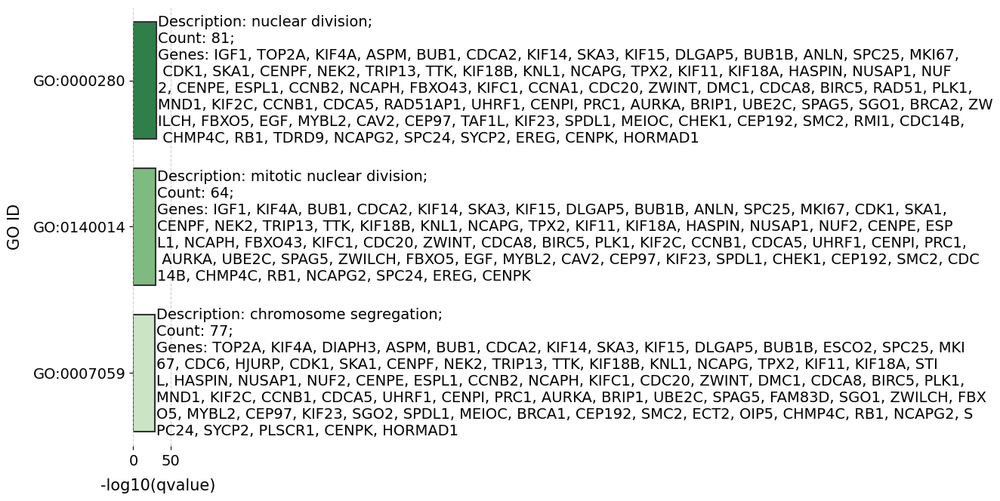

In [3]:

run_r_script('BH_Mock_vs_GSE157103NonICU.csv')


up_GO = "GO_Upregulated_BH_Mock_vs_GSE157103NonICU.csv"
down_GO = "GO_Downregulated_BH_Mock_vs_GSE157103NonICU.csv"

upregulated_GO = pd.read_csv(up_GO)
downregulated_GO = pd.read_csv(down_GO)


upregulated_GO_filtered_OTE = upregulated_GO[upregulated_GO['qvalue'] < 0.05]
downregulated_GO_filtered_OTE = downregulated_GO[downregulated_GO['qvalue'] < 0.05]

upregulated_df_GSE157103NonICU=upregulated_GO_filtered_OTE
downregulated_df_GSE157103NonICU=downregulated_GO_filtered_OTE

max_log_qvalue = 65

plot_go_terms(upregulated_df_GSE157103NonICU, 'Upregulated', max_log_qvalue, height=7,top_n=3)



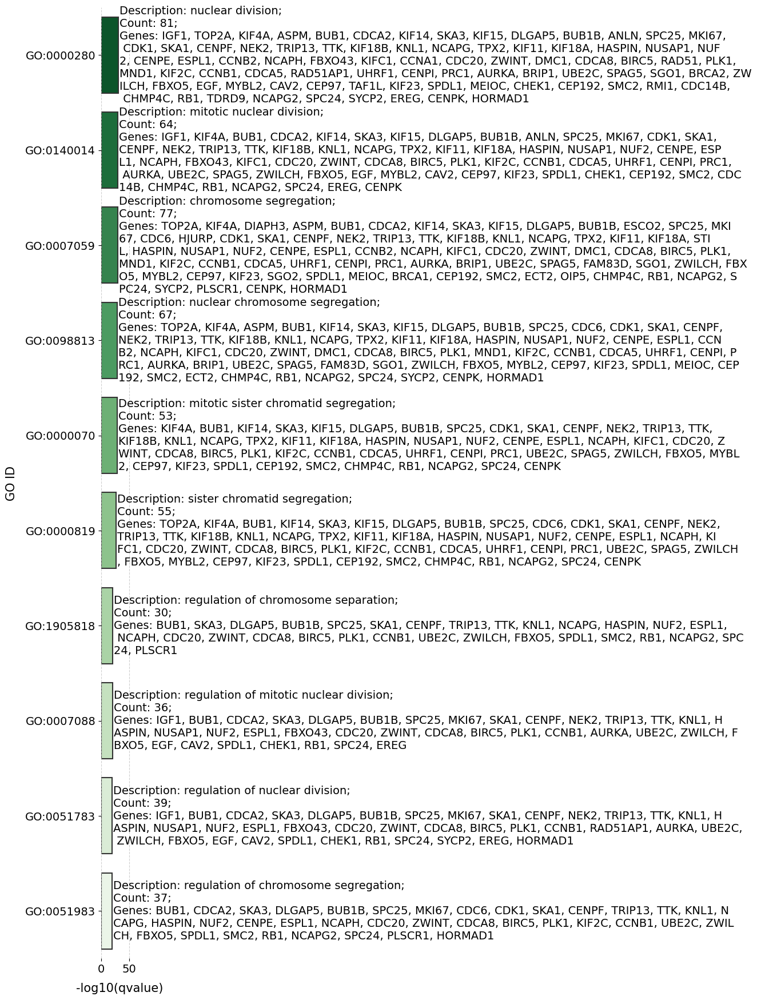

In [4]:
plot_go_terms(upregulated_df_GSE157103NonICU, 'Upregulated', max_log_qvalue, height=18,top_n=10)

R script output: [1] "R Script is running ..."
[1] "D:/0000000000000-WFIRM-Assistant Professor/00000000-Papers/00005- Others/000001-Pandemic prediction/0000- Manuscript 1-Covid/0002- Codes - Aftre Revision- GitHub/1-Ready for GitHub"
Performing GO analysis for: GO_Upregulated_BH_Mock_vs_GSE157103ICU.csv 
Number of ENTREZ IDs: 0 
No genes available for GO enrichment analysis in GO_Upregulated_BH_Mock_vs_GSE157103ICU.csv 
NULL
Performing GO analysis for: GO_Downregulated_BH_Mock_vs_GSE157103ICU.csv 
Number of ENTREZ IDs: 0 
No genes available for GO enrichment analysis in GO_Downregulated_BH_Mock_vs_GSE157103ICU.csv 
NULL
R Script execution completed successfully.

R script errors: Welcome to enrichR
Checking connections ... 
Enrichr ... Connection is Live!
FlyEnrichr ... Connection is Live!
WormEnrichr ... Connection is Live!
YeastEnrichr ... Connection is Live!
FishEnrichr ... Connection is Live!
OxEnrichr ... Connection is Live!
Warning message:
package 'enrichR' was built under R ve

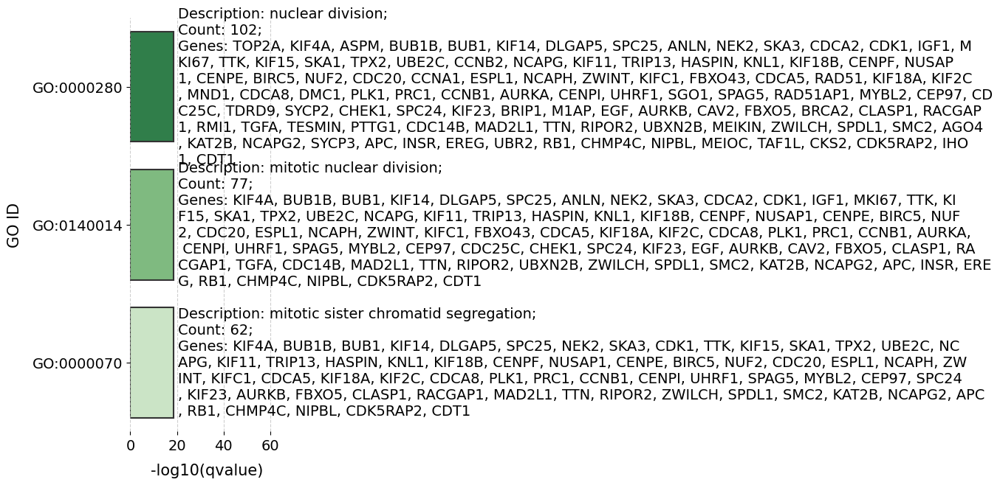

In [5]:

run_r_script('BH_Mock_vs_GSE157103ICU.csv')


up_GO = "GO_Upregulated_BH_Mock_vs_GSE157103ICU.csv"
down_GO = "GO_Downregulated_BH_Mock_vs_GSE157103ICU.csv"

upregulated_GO = pd.read_csv(up_GO)
downregulated_GO = pd.read_csv(down_GO)


upregulated_GO_filtered_OTE = upregulated_GO[upregulated_GO['qvalue'] < 0.05]
downregulated_GO_filtered_OTE = downregulated_GO[downregulated_GO['qvalue'] < 0.05]

upregulated_df_GSE157103ICU=upregulated_GO_filtered_OTE
downregulated_df_GSE157103ICU=downregulated_GO_filtered_OTE

max_log_qvalue = 65

plot_go_terms(upregulated_df_GSE157103ICU, 'Upregulated', max_log_qvalue, height=7,top_n=3)



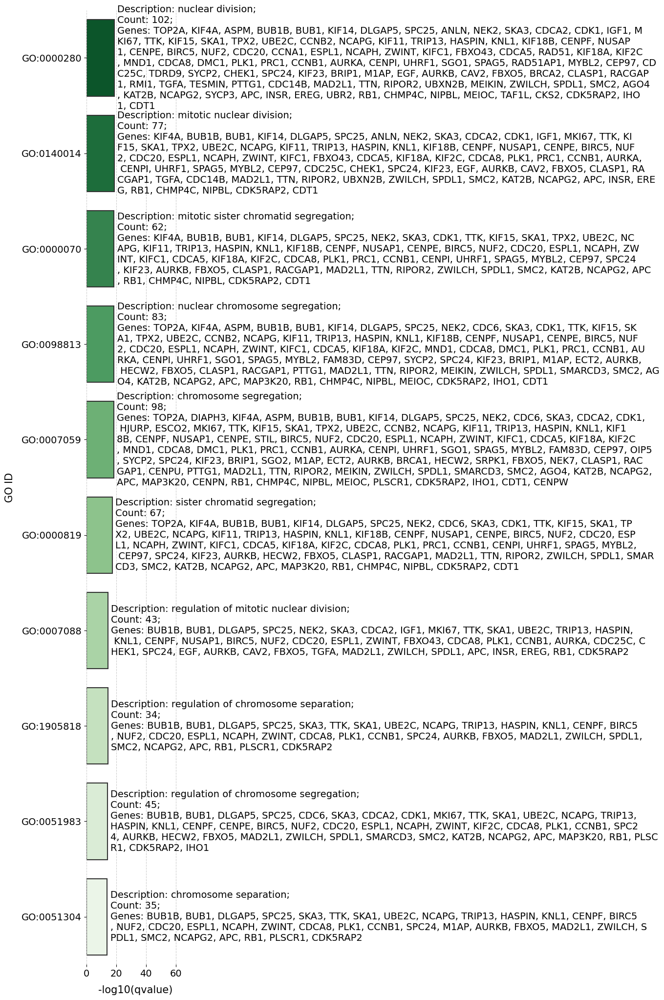

In [6]:
plot_go_terms(upregulated_df_GSE157103ICU, 'Upregulated', max_log_qvalue, height=21,top_n=10)

R script output: [1] "R Script is running ..."
[1] "D:/0000000000000-WFIRM-Assistant Professor/00000000-Papers/00005- Others/000001-Pandemic prediction/0000- Manuscript 1-Covid/0002- Codes - Aftre Revision- GitHub/1-Ready for GitHub"
Performing GO analysis for: GO_Upregulated_BH_Mock_vs_GSE171110.csv 
Number of ENTREZ IDs: 0 
No genes available for GO enrichment analysis in GO_Upregulated_BH_Mock_vs_GSE171110.csv 
NULL
Performing GO analysis for: GO_Downregulated_BH_Mock_vs_GSE171110.csv 
Number of ENTREZ IDs: 0 
No genes available for GO enrichment analysis in GO_Downregulated_BH_Mock_vs_GSE171110.csv 
NULL
R Script execution completed successfully.

R script errors: Welcome to enrichR
Checking connections ... 
Enrichr ... Connection is Live!
FlyEnrichr ... Connection is Live!
WormEnrichr ... Connection is Live!
YeastEnrichr ... Connection is Live!
FishEnrichr ... Connection is Live!
OxEnrichr ... Connection is Live!
Warning message:
package 'enrichR' was built under R version 4.4.3 

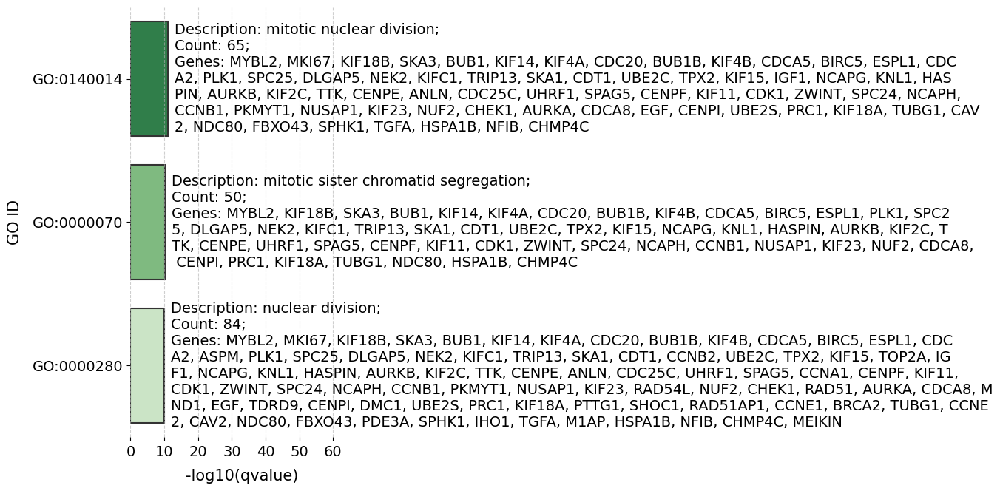

In [7]:

run_r_script('BH_Mock_vs_GSE171110.csv')


up_GO = "GO_Upregulated_BH_Mock_vs_GSE171110.csv"
down_GO = "GO_Downregulated_BH_Mock_vs_GSE171110.csv"

upregulated_GO = pd.read_csv(up_GO)
downregulated_GO = pd.read_csv(down_GO)


upregulated_GO_filtered_OTE = upregulated_GO[upregulated_GO['qvalue'] < 0.05]
downregulated_GO_filtered_OTE = downregulated_GO[downregulated_GO['qvalue'] < 0.05]

upregulated_df_GSE171110=upregulated_GO_filtered_OTE
downregulated_df_GSE171110=downregulated_GO_filtered_OTE

max_log_qvalue = 65

plot_go_terms(upregulated_df_GSE171110, 'Upregulated', max_log_qvalue, height=7,top_n=3)



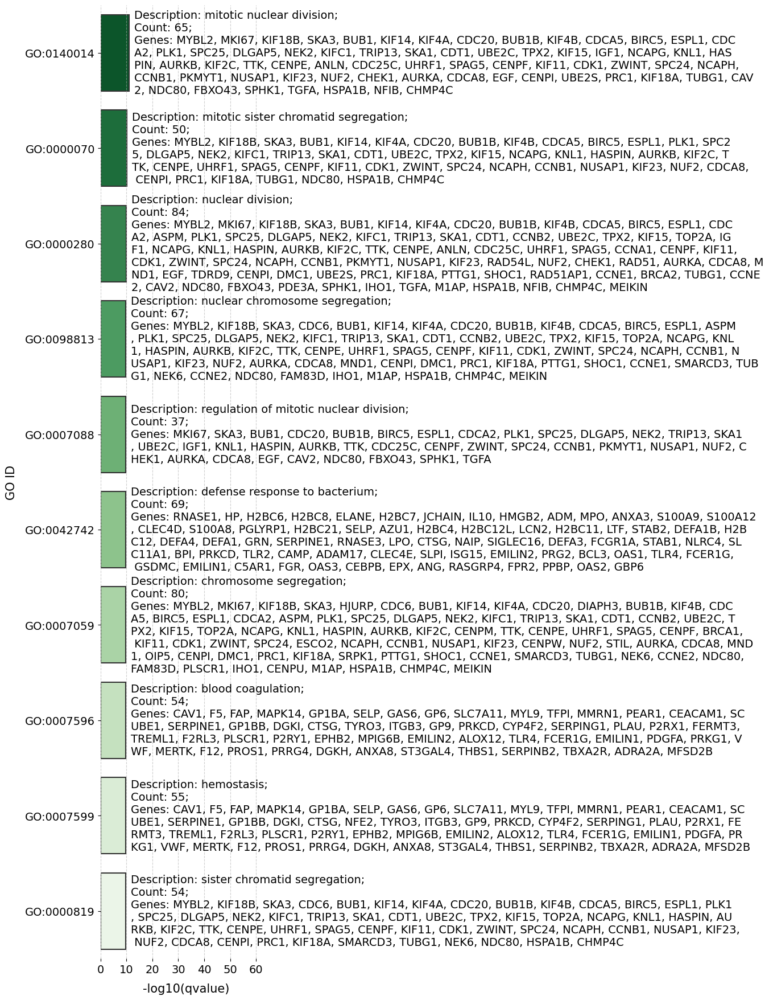

In [8]:
plot_go_terms(upregulated_df_GSE171110, 'Upregulated', max_log_qvalue, height=18,top_n=10)

R script output: [1] "R Script is running ..."
[1] "D:/0000000000000-WFIRM-Assistant Professor/00000000-Papers/00005- Others/000001-Pandemic prediction/0000- Manuscript 1-Covid/0002- Codes - Aftre Revision- GitHub/1-Ready for GitHub"
Performing GO analysis for: GO_Upregulated_BH_Mock_vs_GSE189039.csv 
Number of ENTREZ IDs: 0 
No genes available for GO enrichment analysis in GO_Upregulated_BH_Mock_vs_GSE189039.csv 
NULL
Performing GO analysis for: GO_Downregulated_BH_Mock_vs_GSE189039.csv 
Number of ENTREZ IDs: 0 
No genes available for GO enrichment analysis in GO_Downregulated_BH_Mock_vs_GSE189039.csv 
NULL
R Script execution completed successfully.

R script errors: Welcome to enrichR
Checking connections ... 
Enrichr ... Connection is Live!
FlyEnrichr ... Connection is Live!
WormEnrichr ... Connection is Live!
YeastEnrichr ... Connection is Live!
FishEnrichr ... Connection is Live!
OxEnrichr ... Connection is Live!
Warning message:
package 'enrichR' was built under R version 4.4.3 

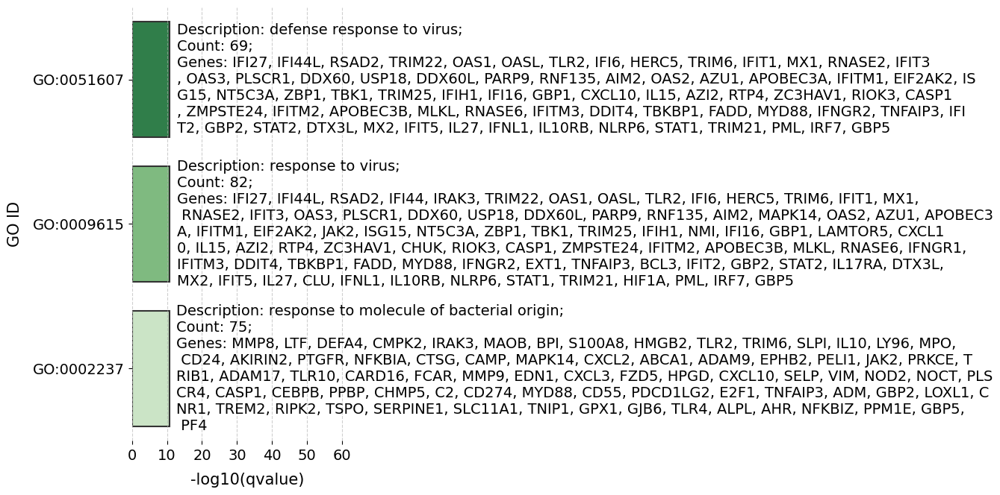

In [9]:

run_r_script('BH_Mock_vs_GSE189039.csv')


up_GO = "GO_Upregulated_BH_Mock_vs_GSE189039.csv"
down_GO = "GO_Downregulated_BH_Mock_vs_GSE189039.csv"

upregulated_GO = pd.read_csv(up_GO)
downregulated_GO = pd.read_csv(down_GO)


upregulated_GO_filtered_OTE = upregulated_GO[upregulated_GO['qvalue'] < 0.05]
downregulated_GO_filtered_OTE = downregulated_GO[downregulated_GO['qvalue'] < 0.05]

upregulated_df_GSE189039=upregulated_GO_filtered_OTE
downregulated_df_GSE189039=downregulated_GO_filtered_OTE

max_log_qvalue = 65

plot_go_terms(upregulated_df_GSE189039, 'Upregulated', max_log_qvalue, height=7,top_n=3)



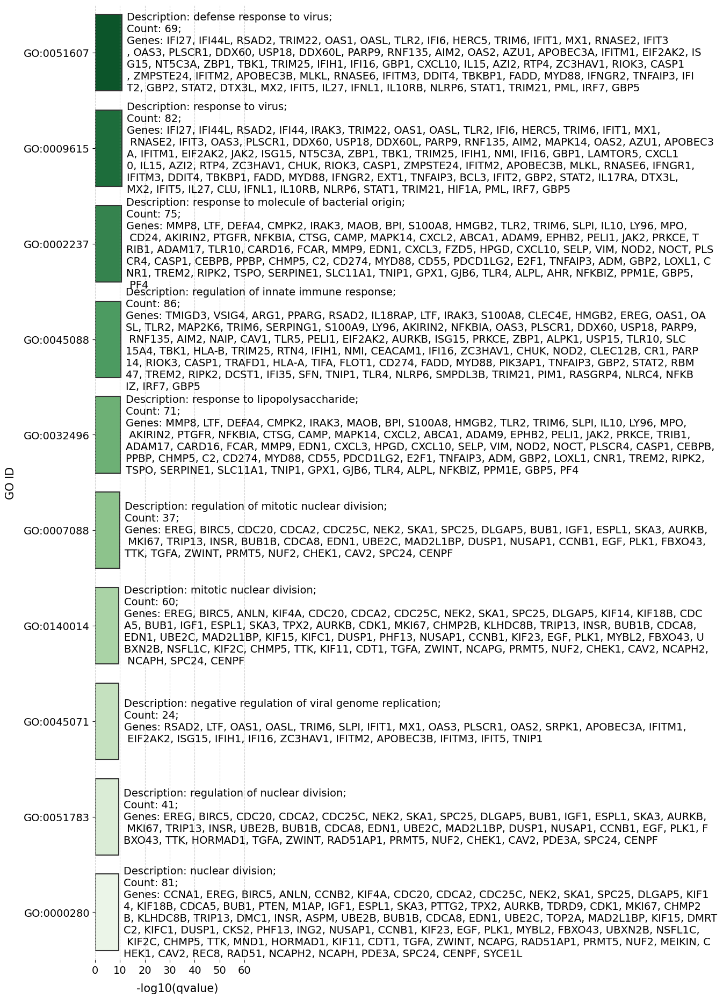

In [10]:
plot_go_terms(upregulated_df_GSE189039, 'Upregulated', max_log_qvalue, height=19,top_n=10)

R script output: [1] "R Script is running ..."
[1] "D:/0000000000000-WFIRM-Assistant Professor/00000000-Papers/00005- Others/000001-Pandemic prediction/0000- Manuscript 1-Covid/0002- Codes - Aftre Revision- GitHub/1-Ready for GitHub"
Performing GO analysis for: GO_Upregulated_BH_Mock_vs_GSE201530.csv 
Number of ENTREZ IDs: 0 
No genes available for GO enrichment analysis in GO_Upregulated_BH_Mock_vs_GSE201530.csv 
NULL
Performing GO analysis for: GO_Downregulated_BH_Mock_vs_GSE201530.csv 
Number of ENTREZ IDs: 0 
No genes available for GO enrichment analysis in GO_Downregulated_BH_Mock_vs_GSE201530.csv 
NULL
R Script execution completed successfully.

R script errors: Welcome to enrichR
Checking connections ... 
Enrichr ... Connection is Live!
FlyEnrichr ... Connection is Live!
WormEnrichr ... Connection is Live!
YeastEnrichr ... Connection is Live!
FishEnrichr ... Connection is Live!
OxEnrichr ... Connection is Live!
Warning message:
package 'enrichR' was built under R version 4.4.3 

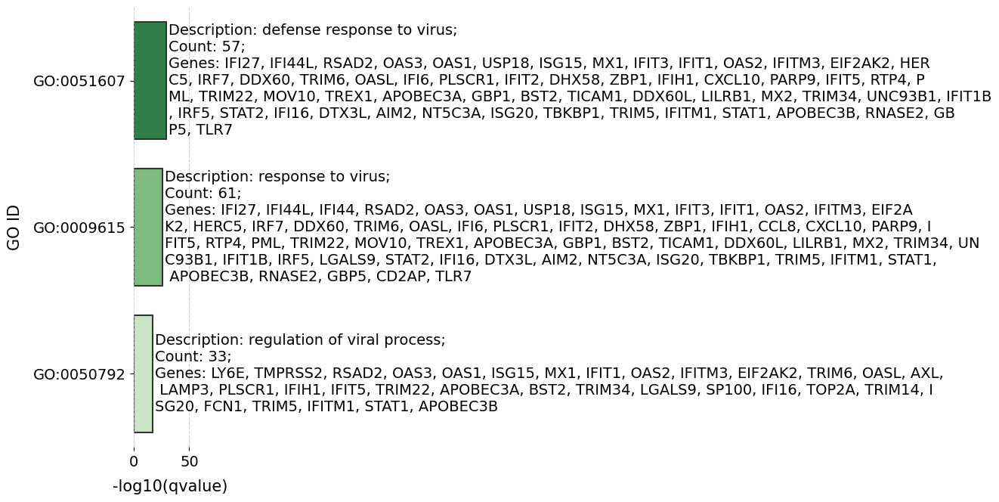

In [11]:

run_r_script('BH_Mock_vs_GSE201530.csv')


up_GO = "GO_Upregulated_BH_Mock_vs_GSE201530.csv"
down_GO = "GO_Downregulated_BH_Mock_vs_GSE201530.csv"

upregulated_GO = pd.read_csv(up_GO)
downregulated_GO = pd.read_csv(down_GO)


upregulated_GO_filtered_OTE = upregulated_GO[upregulated_GO['qvalue'] < 0.05]
downregulated_GO_filtered_OTE = downregulated_GO[downregulated_GO['qvalue'] < 0.05]

upregulated_df_GSE201530=upregulated_GO_filtered_OTE
downregulated_df_GSE201530=downregulated_GO_filtered_OTE

max_log_qvalue = 65

plot_go_terms(upregulated_df_GSE201530, 'Upregulated', max_log_qvalue, height=7,top_n=3)



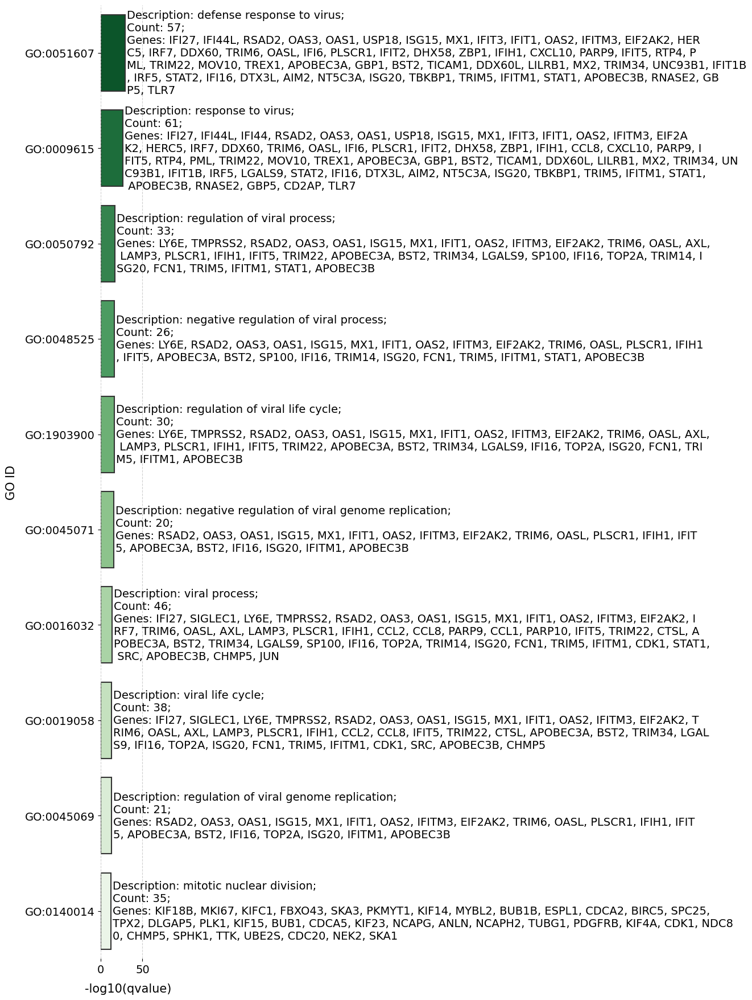

In [12]:
plot_go_terms(upregulated_df_GSE201530, 'Upregulated', max_log_qvalue, height=18,top_n=10)

In [13]:
import pandas as pd

def load_and_filter_GO(file_path):
    go_data = pd.read_csv(file_path)
    go_data_filtered = go_data[go_data['qvalue'] < 0.05]
    return go_data_filtered

strains = ['GSE157103NonICU', 'GSE157103ICU', 'GSE171110', 'GSE189039', 'GSE201530']
go_terms = {}
for strain in strains:
    file_path = f"GO_Upregulated_BH_Mock_vs_{strain}.csv"
    go_terms[strain] = load_and_filter_GO(file_path)

common_go_terms = set(go_terms[strains[0]]['ID'])
for strain in strains[1:]:
    common_go_terms.intersection_update(set(go_terms[strain]['ID']))

print(f"Number of Common GO Terms Across All Strains: {len(common_go_terms)}")
print("Common GO Terms:")
print(common_go_terms)

unique_go_terms = {}
for strain in strains:
    other_strains = set(strains) - set([strain])  
    other_terms = set().union(*(set(go_terms[other]['ID']) for other in other_strains))
    unique_terms = set(go_terms[strain]['ID']) - other_terms
    unique_go_terms[strain] = unique_terms

for strain in strains:
    print(f"Number of Unique GO Terms for {strain}: {len(unique_go_terms[strain])}")
    print(f"Unique GO Terms for {strain}:")
    print(unique_go_terms[strain])
    
    



Number of Common GO Terms Across All Strains: 122
Common GO Terms:
{'GO:0010965', 'GO:0071695', 'GO:0048144', 'GO:0007091', 'GO:1902100', 'GO:1903046', 'GO:0061640', 'GO:0007143', 'GO:0000022', 'GO:0050000', 'GO:0071174', 'GO:0045785', 'GO:0071216', 'GO:0044409', 'GO:0000082', 'GO:0051983', 'GO:0032496', 'GO:1901970', 'GO:0045787', 'GO:0003018', 'GO:1902749', 'GO:0044403', 'GO:0006935', 'GO:0051304', 'GO:0007093', 'GO:1902099', 'GO:0045842', 'GO:0090266', 'GO:0051225', 'GO:1902101', 'GO:0051306', 'GO:0051310', 'GO:1905818', 'GO:1901988', 'GO:0045930', 'GO:0033046', 'GO:0008608', 'GO:0090231', 'GO:0071173', 'GO:0000819', 'GO:0042742', 'GO:0044839', 'GO:0000280', 'GO:0045839', 'GO:1905819', 'GO:0045841', 'GO:0045931', 'GO:0030261', 'GO:0033048', 'GO:0042770', 'GO:1901987', 'GO:0071222', 'GO:1901989', 'GO:0140694', 'GO:2001251', 'GO:0000075', 'GO:0090307', 'GO:0007088', 'GO:0030071', 'GO:0140014', 'GO:0006909', 'GO:0044772', 'GO:0051256', 'GO:0098813', 'GO:0051255', 'GO:0051784', 'GO:0007

<Figure size 1008x1080 with 0 Axes>

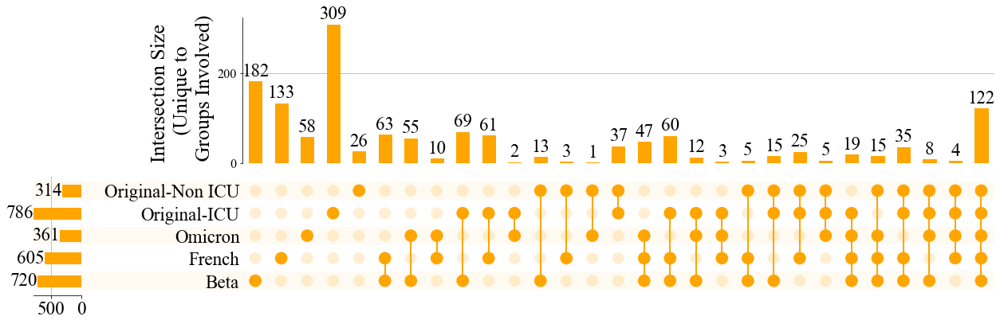

In [14]:
import pandas as pd
from upsetplot import UpSet, from_memberships
import matplotlib.pyplot as plt


data = {
    'Original-Non ICU': set(list(upregulated_df_GSE157103NonICU['ID'])),
    'Original-ICU': set(list(upregulated_df_GSE157103ICU['ID'])),
     'French': set(list(upregulated_df_GSE171110['ID'])),
    'Beta': set(list(upregulated_df_GSE189039['ID'])),    
    'Omicron': set(list(upregulated_df_GSE201530['ID'])),   

}

sorted_memberships = sorted(
    (list(k for k, v in data.items() if gene in v) for gene in set().union(*data.values())),
    key=lambda x: (len(x), x)  
)

combined = from_memberships(sorted_memberships)

plt.figure(figsize=(14, 15))  

plt.rcParams.update({
    'font.size': 23,             
    'font.family': 'Times New Roman',      
    'font.weight': 'normal',      
    'font.style': 'normal'      
})

from upsetplot import UpSet

upset = UpSet(combined, 
              subset_size='count', 
              element_size=42, 
              show_counts=True, 
              sort_categories_by=None, 
              facecolor='orange')  

upset.plot()

plt.setp(plt.gca().get_yticklabels(), fontsize=16, fontweight='normal', family='Times New Roman')
plt.gca().set_ylabel('Intersection Size \n (Unique to \n Groups Involved)', fontsize=26, fontweight='normal', family='Times New Roman')


plt.show()


In [15]:
import pandas as pd

def load_and_filter_GO(file_path):
    go_data = pd.read_csv(file_path)
    go_data_filtered = go_data[go_data['qvalue'] < 0.05]
    return go_data_filtered

strains = ['GSE157103NonICU', 'GSE157103ICU', 'GSE171110', 'GSE189039', 'GSE201530']
go_terms = {}
for strain in strains:
    file_path = f"GO_Upregulated_BH_Mock_vs_{strain}.csv"
    go_terms[strain] = load_and_filter_GO(file_path)

common_go_terms = set(go_terms[strains[0]]['Description'])
for strain in strains[1:]:
    common_go_terms.intersection_update(set(go_terms[strain]['Description']))

print(f"Number of Common GO Terms Across All Strains: {len(common_go_terms)}")
print("Common GO Terms:")
print(common_go_terms)

unique_go_terms = {}
for strain in strains:
    other_strains = set(strains) - set([strain])  
    other_terms = set().union(*(set(go_terms[other]['Description']) for other in other_strains))
    unique_terms = set(go_terms[strain]['Description']) - other_terms
    unique_go_terms[strain] = unique_terms

for strain in strains:
    print(f" \n \n \n Number of Unique GO Terms for {strain}: {len(unique_go_terms[strain])}")
    print(f"Unique GO Terms for {strain}:")
    print(unique_go_terms[strain])
    
    



Number of Common GO Terms Across All Strains: 122
Common GO Terms:
{'positive regulation of mitotic metaphase/anaphase transition', 'symbiont entry into host cell', 'G2/M transition of mitotic cell cycle', 'metaphase/anaphase transition of cell cycle', 'meiosis I cell cycle process', 'negative regulation of mitotic cell cycle', 'positive regulation of cell cycle', 'positive regulation of cell cycle process', 'spindle organization', 'positive regulation of cell cycle phase transition', 'mitotic metaphase chromosome alignment', 'symbiont entry into host', 'nuclear division', 'regulation of mitotic spindle checkpoint', 'negative regulation of G2/M transition of mitotic cell cycle', 'regulation of spindle checkpoint', 'regulation of tumor necrosis factor superfamily cytokine production', 'chromosome localization', 'mitotic spindle assembly', 'spindle checkpoint signaling', 'meiotic nuclear division', 'regulation of mitotic sister chromatid segregation', 'tumor necrosis factor superfamily c

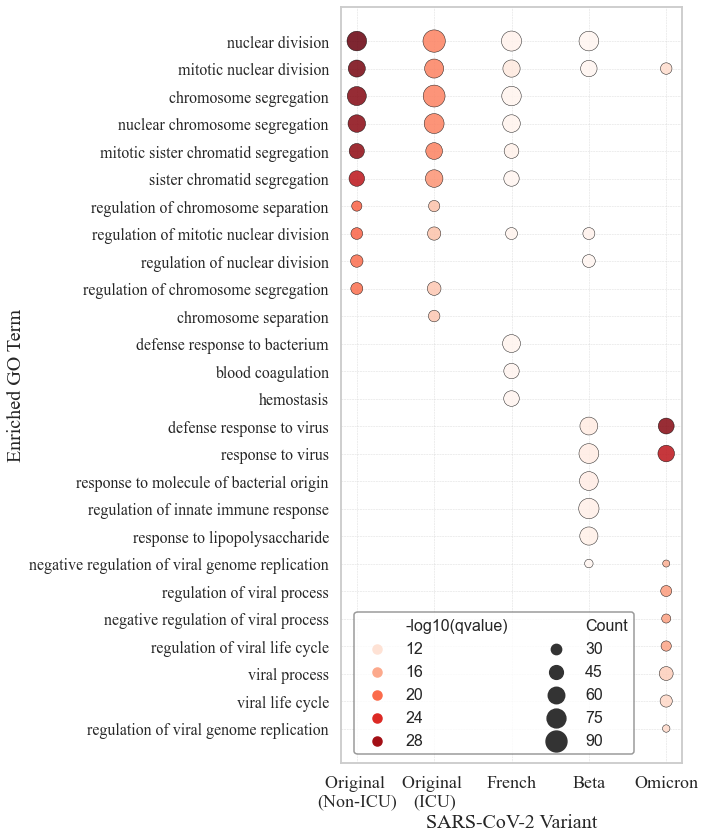

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def load_top_GO(file_path, strain_name, top_n=20):
    df = pd.read_csv(file_path)
    df = df[df['qvalue'] < 0.05].copy()
    df['-log10(qvalue)'] = -np.log10(df['qvalue'])
    df['Strain'] = strain_name
    df_top = df.sort_values(by='qvalue').head(top_n)
    return df_top

strain_files = {
    'GSE157103NonICU': 'Original \n(Non-ICU)',
    'GSE157103ICU': 'Original \n(ICU)',
    'GSE171110': 'French',
    'GSE189039': 'Beta',
    'GSE201530': 'Omicron'
}

top_all_df = []
for fname, label in strain_files.items():
    path = f'GO_Upregulated_BH_Mock_vs_{fname}.csv'
    top_all_df.append(load_top_GO(path, label, top_n=10))

combined_df = pd.concat(top_all_df)

sns.set(style='whitegrid', context='talk')

plt.figure(figsize=(10, 12))
plot = sns.scatterplot(
    data=combined_df,
    x='Strain',
    y='Description',
    size='Count',
    hue='-log10(qvalue)',
    palette='Reds',
    sizes=(50, 500),
    edgecolor='black',
    linewidth=0.5,
    alpha=0.85
)

plt.xticks(rotation=0, fontsize=18, family='Times New Roman')
plt.yticks(fontsize=16, family='Times New Roman')
plt.xlabel('SARS-CoV-2 Variant', fontsize=20, family='Times New Roman')
plt.ylabel('Enriched GO Term', fontsize=20, family='Times New Roman')

legend = plt.legend(

    fontsize=16, 
    title_fontsize=18, 
    loc='upper right',
    bbox_to_anchor=(.86, .2), 
    borderaxespad=0.,
    frameon=True,
    ncol=2
)
legend.get_frame().set_edgecolor('gray')

plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()


In [17]:
import pandas as pd
import numpy as np

def load_top_GO(file_path, strain_name, top_n=10):
    df = pd.read_csv(file_path)
    df = df[df['qvalue'] < 0.05].copy()
    df['-log10(qvalue)'] = -np.log10(df['qvalue'])
    df['Strain'] = strain_name
    df_top = df.sort_values(by='qvalue').head(top_n)
    return df_top[['Strain', 'Description', 'qvalue', 'Count', '-log10(qvalue)']]


strain_files = {
    'GSE157103NonICU': 'Original (Non-ICU)',
    'GSE157103ICU': 'Original (ICU)',
    'GSE171110': 'French',
    'GSE189039': 'Beta',
    'GSE201530': 'Omicron'
}

all_tables = []
for fname, label in strain_files.items():
    file_path = f'GO_Upregulated_BH_Mock_vs_{fname}.csv'
    try:
        table = load_top_GO(file_path, label, top_n=10)
        all_tables.append(table)
    except FileNotFoundError:
        print(f"File not found: {file_path}")

if all_tables:
    combined_df = pd.concat(all_tables).reset_index(drop=True)
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_colwidth', None)
    print("\nTop 10 GO terms for each SARS-CoV-2 strain (q < 0.05):\n")
    print(combined_df.to_string(index=False))



Top 10 GO terms for each SARS-CoV-2 strain (q < 0.05):

             Strain                                      Description        qvalue  Count  -log10(qvalue)
 Original (Non-ICU)                                 nuclear division  2.772294e-31     81       30.557161
 Original (Non-ICU)                         mitotic nuclear division  1.413419e-30     64       29.849729
 Original (Non-ICU)                           chromosome segregation  4.985827e-30     77       29.302263
 Original (Non-ICU)                   nuclear chromosome segregation  8.584691e-30     67       29.066275
 Original (Non-ICU)             mitotic sister chromatid segregation  1.254116e-29     53       28.901662
 Original (Non-ICU)                     sister chromatid segregation  3.978109e-27     55       26.400323
 Original (Non-ICU)              regulation of chromosome separation  2.911465e-21     30       20.535888
 Original (Non-ICU)           regulation of mitotic nuclear division  3.700884e-21     36      

In [18]:
for strain in combined_df['Strain'].unique():
    print(f"\nTop GO terms for {strain}:")
    df_subset = combined_df[combined_df['Strain'] == strain]
    print(df_subset[['Description', 'qvalue', 'Count']].sort_values(by='qvalue').to_string(index=False))



Top GO terms for Original (Non-ICU):
                            Description        qvalue  Count
                       nuclear division  2.772294e-31     81
               mitotic nuclear division  1.413419e-30     64
                 chromosome segregation  4.985827e-30     77
         nuclear chromosome segregation  8.584691e-30     67
   mitotic sister chromatid segregation  1.254116e-29     53
           sister chromatid segregation  3.978109e-27     55
    regulation of chromosome separation  2.911465e-21     30
 regulation of mitotic nuclear division  3.700884e-21     36
         regulation of nuclear division  1.377610e-20     39
   regulation of chromosome segregation  1.724238e-20     37

Top GO terms for Original (ICU):
                            Description        qvalue  Count
                       nuclear division  2.634395e-19    102
               mitotic nuclear division  2.634395e-19     77
   mitotic sister chromatid segregation  2.702957e-19     62
         nucl

<Figure size 1008x1080 with 0 Axes>

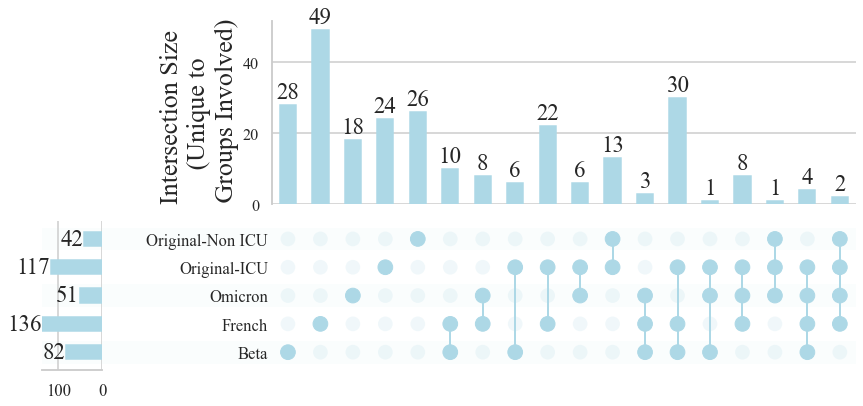

In [19]:
import pandas as pd
from upsetplot import UpSet, from_memberships
import matplotlib.pyplot as plt

data = {
    'Original-Non ICU': set(list(downregulated_df_GSE157103NonICU['ID'])),
    'Original-ICU': set(list(downregulated_df_GSE157103ICU['ID'])),
     'French': set(list(downregulated_df_GSE171110['ID'])),
    'Beta': set(list(downregulated_df_GSE189039['ID'])),    
    'Omicron': set(list(downregulated_df_GSE201530['ID'])),   

}

sorted_memberships = sorted(
    (list(k for k, v in data.items() if gene in v) for gene in set().union(*data.values())),
    key=lambda x: (len(x), x)  
)

combined = from_memberships(sorted_memberships)

plt.figure(figsize=(14, 15)) 
plt.rcParams.update({
    'font.size': 23,             
    'font.family': 'Times New Roman',     
    'font.weight': 'normal',     
    'font.style': 'normal'     
})

from upsetplot import UpSet

upset = UpSet(combined, 
              subset_size='count', 
              element_size=42, 
              show_counts=True, 
              sort_categories_by=None, 
              facecolor='lightblue')  

upset.plot()

plt.setp(plt.gca().get_yticklabels(), fontsize=16, fontweight='normal', family='Times New Roman')
plt.gca().set_ylabel('Intersection Size \n (Unique to \n Groups Involved)', fontsize=26, fontweight='normal', family='Times New Roman')


plt.show()


In [20]:
upregulated_df_GSE157103NonICU

,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,GeneSymbols
0,GO:0000280,nuclear division,81/665,451/18986,0.179601,5.127673,16.902027,6.910730e-35,3.148529e-31,2.772294e-31,3479/7153/24137/259266/699/157313/9928/221150/56992/9787/701/54443/57405/4288/983/220134/1063/4751/9319/7272/146909/57082/64151/22974/3832/81930/83903/51203/83540/1062/9700/9133/23397/286151/3833/8900/991/11130/11144/55143/332/5888/5347/84057/11004/891/113130/10635/29128/2491/9055/6790/83990/11065/10615/151648/675/55055/26271/1950/4605/858/79598/138474/9493/54908/284071/1111/55125/10592/80010/8555/92421/5925/122402/54892/147841/10388/2069/64105/84072,81,"IGF1, TOP2A, KIF4A, ASPM, BUB1, CDCA2, KIF14, SKA3, KIF15, DLGAP5, BUB1B, ANLN, SPC25, MKI67, CDK1, SKA1, CENPF, NEK2, TRIP13, TTK, KIF18B, KNL1, NCAPG, TPX2, KIF11, KIF18A, HASPIN, NUSAP1, NUF2, CENPE, ESPL1, CCNB2, NCAPH, FBXO43, KIFC1, CCNA1, CDC20, ZWINT, DMC1, CDCA8, BIRC5, RAD51, PLK1, MND1, KIF2C, CCNB1, CDCA5, RAD51AP1, UHRF1, CENPI, PRC1, AURKA, BRIP1, UBE2C, SPAG5, SGO1, BRCA2, ZWILCH, FBXO5, EGF, MYBL2, CAV2, CEP97, TAF1L, KIF23, SPDL1, MEIOC, CHEK1, CEP192, SMC2, RMI1, CDC14B, CHMP4C, RB1, TDRD9, NCAPG2, SPC24, SYCP2, EREG, CENPK, HORMAD1"
1,GO:0140014,mitotic nuclear division,64/665,282/18986,0.226950,6.479518,17.662054,7.046697e-34,1.605238e-30,1.413419e-30,3479/24137/699/157313/9928/221150/56992/9787/701/54443/57405/4288/983/220134/1063/4751/9319/7272/146909/57082/64151/22974/3832/81930/83903/51203/83540/1062/9700/23397/286151/3833/991/11130/55143/332/5347/11004/891/113130/29128/2491/9055/6790/11065/10615/55055/26271/1950/4605/858/79598/9493/54908/1111/55125/10592/8555/92421/5925/54892/147841/2069/64105,64,"IGF1, KIF4A, BUB1, CDCA2, KIF14, SKA3, KIF15, DLGAP5, BUB1B, ANLN, SPC25, MKI67, CDK1, SKA1, CENPF, NEK2, TRIP13, TTK, KIF18B, KNL1, NCAPG, TPX2, KIF11, KIF18A, HASPIN, NUSAP1, NUF2, CENPE, ESPL1, NCAPH, FBXO43, KIFC1, CDC20, ZWINT, CDCA8, BIRC5, PLK1, KIF2C, CCNB1, CDCA5, UHRF1, CENPI, PRC1, AURKA, UBE2C, SPAG5, ZWILCH, FBXO5, EGF, MYBL2, CAV2, CEP97, KIF23, SPDL1, CHEK1, CEP192, SMC2, CDC14B, CHMP4C, RB1, NCAPG2, SPC24, EREG, CENPK"
2,GO:0007059,chromosome segregation,77/665,429/18986,0.179487,5.124426,16.461896,3.728577e-33,5.662466e-30,4.985827e-30,7153/24137/81624/259266/699/157313/9928/221150/56992/9787/701/157570/57405/4288/990/55355/983/220134/1063/4751/9319/7272/146909/57082/64151/22974/3832/81930/6491/83903/51203/83540/1062/9700/9133/23397/3833/991/11130/11144/55143/332/5347/84057/11004/891/113130/29128/2491/9055/6790/83990/11065/10615/81610/151648/55055/26271/4605/79598/9493/151246/54908/284071/672/55125/10592/1894/11339/92421/5925/54892/147841/10388/5359/64105/84072,77,"TOP2A, KIF4A, DIAPH3, ASPM, BUB1, CDCA2, KIF14, SKA3, KIF15, DLGAP5, BUB1B, ESCO2, SPC25, MKI67, CDC6, HJURP, CDK1, SKA1, CENPF, NEK2, TRIP13, TTK, KIF18B, KNL1, NCAPG, TPX2, KIF11, KIF18A, STIL, HASPIN, NUSAP1, NUF2, CENPE, ESPL1, CCNB2, NCAPH, KIFC1, CDC20, ZWINT, DMC1, CDCA8, BIRC5, PLK1, MND1, KIF2C, CCNB1, CDCA5, UHRF1, CENPI, PRC1, AURKA, BRIP1, UBE2C, SPAG5, FAM83D, SGO1, ZWILCH, FBXO5, MYBL2, CEP97, KIF23, SGO2, SPDL1, MEIOC, BRCA1, CEP192, SMC2, ECT2, OIP5, CHMP4C, RB1, NCAPG2, SPC24, SYCP2, PLSCR1, CENPK, HORMAD1"
3,GO:0098813,nuclear chromosome segregation,67/665,324/18986,0.206790,5.903936,16.962104,8.559912e-33,9.749740e-30,8.584691e-30,7153/24137/259266/699/9928/221150/56992/9787/701/57405/990/983/220134/1063/4751/9319/7272/146909/57082/64151/22974/3832/81930/83903/51203/83540/1062/9700/9133/23397/3833/991/11130/11144/55143/332/5347/84057/11004/891/113130/29128/2491/9055/6790/83990/11065/10615/81610/151648/55055/26271/4605/79598/9493/54908/284071/55125/10592/1894/92421/5925/54892/147841/10388/64105/84072,67,"TOP2A, KIF4A, ASPM, BUB1, KIF14, SKA3, KIF15, DLGAP5, BUB1B, SPC25, CDC6, CDK1, SKA1, CENPF, NEK2, TRIP13, TTK, KIF18B, KNL1, NCAPG, TPX2, KIF11, KIF18A, HASPIN, NUSAP1, NUF2, CENPE, ESPL1, CCNB2, NCAPH, KIFC1, CDC20, ZWINT, DMC1, CDCA8, B

# Pathway Analysis

In [21]:
Significant_BH_Significant_GSE157103_NonICU = pd.read_csv('BH_Mock_vs_GSE157103NonICU.csv')
Significant_BH_Significant_GSE157103_ICU = pd.read_csv('BH_Mock_vs_GSE157103ICU.csv')
Significant_BH_Significant_GSE171110 = pd.read_csv('BH_Mock_vs_GSE171110.csv')
Significant_BH_Significant_GSE189039 = pd.read_csv('BH_Mock_vs_GSE189039.csv')
Significant_BH_Significant_GSE201530 = pd.read_csv('BH_Mock_vs_GSE201530.csv')


In [22]:
from gprofiler import GProfiler


gene_list = Significant_BH_Significant_GSE157103_NonICU['Gene Symbol'].tolist()

gp = GProfiler(return_dataframe=True)

pathway_results = gp.profile(organism='hsapiens', query=gene_list, sources=['REAC'])

significant_pathways = pathway_results[pathway_results['significant'] == True]

print(significant_pathways[['source', 'native', 'name', 'p_value', 'intersection_size', 'effective_domain_size']])


   source              native  \
0    REAC   REAC:R-HSA-156842   
1    REAC   REAC:R-HSA-192823   
2    REAC   REAC:R-HSA-156902   
3    REAC  REAC:R-HSA-2408557   
4    REAC    REAC:R-HSA-72764   
5    REAC    REAC:R-HSA-72689   
6    REAC   REAC:R-HSA-975956   
7    REAC  REAC:R-HSA-9633012   
8    REAC   REAC:R-HSA-156827   
9    REAC    REAC:R-HSA-72706   
10   REAC    REAC:R-HSA-72737   
11   REAC    REAC:R-HSA-72613   
12   REAC  REAC:R-HSA-2408522   
13   REAC   REAC:R-HSA-927802   
14   REAC   REAC:R-HSA-975957   
15   REAC  REAC:R-HSA-1799339   
16   REAC   REAC:R-HSA-168273   
17   REAC   REAC:R-HSA-168255   
18   REAC  REAC:R-HSA-9711097   
19   REAC  REAC:R-HSA-6791226   
20   REAC  REAC:R-HSA-8868773   
21   REAC    REAC:R-HSA-72312   
22   REAC  REAC:R-HSA-9010553   
23   REAC  REAC:R-HSA-9735869   
24   REAC    REAC:R-HSA-72766   
25   REAC  REAC:R-HSA-1640170   
26   REAC    REAC:R-HSA-72695   
27   REAC   REAC:R-HSA-376176   
28   REAC    REAC:R-HSA-69620   
29   REAC 

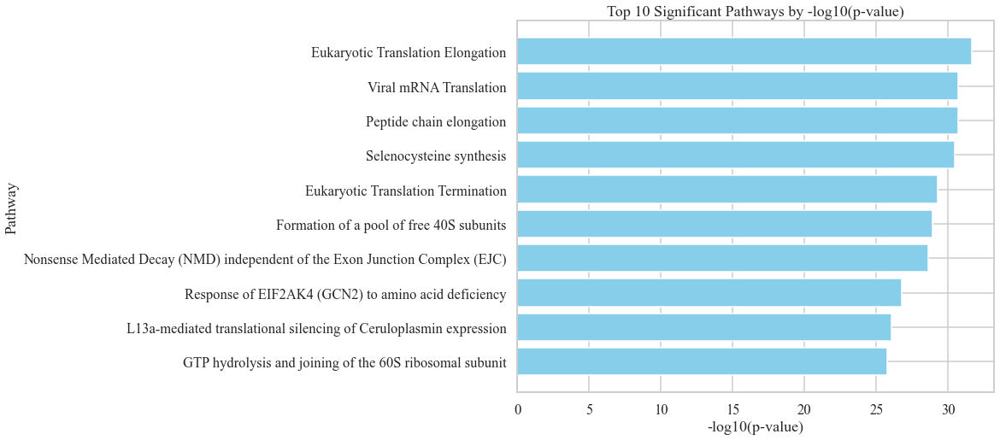

In [23]:
import numpy as np
import matplotlib.pyplot as plt

top_10_pathways = significant_pathways.sort_values('p_value').head(10)

top_10_pathways['negative_log_p'] = -np.log10(top_10_pathways['p_value'])

plt.figure(figsize=(10, 8))
plt.barh(top_10_pathways['name'], top_10_pathways['negative_log_p'], color='skyblue')
plt.xlabel('-log10(p-value)')
plt.ylabel('Pathway')
plt.title('Top 10 Significant Pathways by -log10(p-value)')
plt.gca().invert_yaxis()  
plt.show()


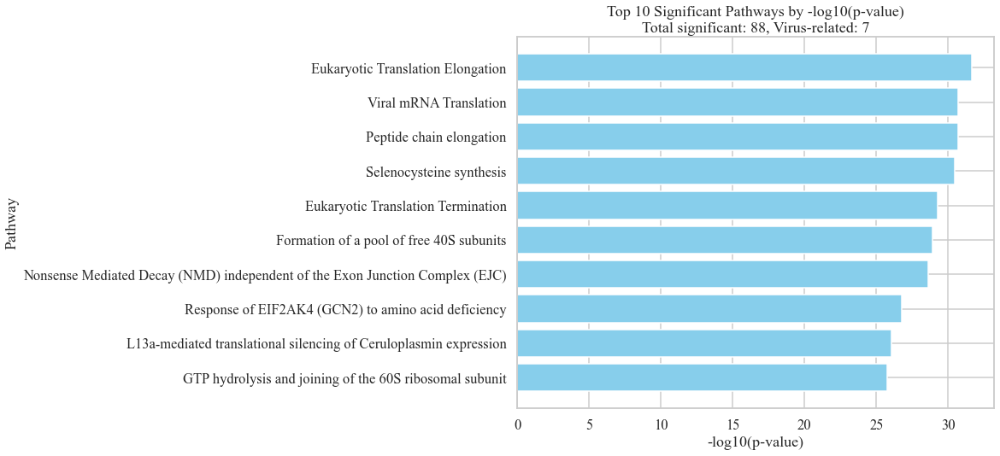

In [24]:
import numpy as np
import matplotlib.pyplot as plt

top_10_pathways = significant_pathways.sort_values('p_value').head(10)

top_10_pathways['negative_log_p'] = -np.log10(top_10_pathways['p_value'])

total_significant = len(significant_pathways)

keywords = ['virus', 'infection', 'viral', 'immune response', 'antiviral', 'replication', 'interferon', 'cytokine storm']

pattern = '|'.join(keywords) 
virus_related_pathways = significant_pathways[significant_pathways['name'].str.contains(pattern, case=False, regex=True)]
count_virus_related = len(virus_related_pathways)

plt.figure(figsize=(10, 8))
plt.barh(top_10_pathways['name'], top_10_pathways['negative_log_p'], color='skyblue')
plt.xlabel('-log10(p-value)')
plt.ylabel('Pathway')
plt.title(f'Top 10 Significant Pathways by -log10(p-value)\nTotal significant: {total_significant}, Virus-related: {count_virus_related}')
plt.gca().invert_yaxis()  
plt.show()


In [25]:
Original_NonICU=Significant_BH_Significant_GSE157103_NonICU
Original_ICU=Significant_BH_Significant_GSE157103_ICU
French=Significant_BH_Significant_GSE171110
Beta=Significant_BH_Significant_GSE189039
Omicron=Significant_BH_Significant_GSE201530

In [26]:
Beta

,Gene Symbol,logFC,logCPM,F,PValue,BH_adjusted_p-value,MAS_Score,MAS_rank,#NAME?,Category
0,ADAMTS2,9.038634,4.756776,319.161230,9.660000e-14,2.970000e-10,86.109783,1,9.526859,Upregulated
1,MAOA,9.018232,5.499252,98.701796,6.980000e-09,3.580000e-07,58.130825,2,6.445922,Upregulated
2,IFI27,8.655776,5.808808,68.503872,1.230000e-07,1.420000e-06,50.609479,3,5.846903,Upregulated
3,OLAH,7.902594,6.225097,80.211901,3.480000e-08,7.440000e-07,48.432658,4,6.128704,Upregulated
4,EPCAM,6.612545,2.110558,111.806905,8.260000e-10,1.110000e-07,46.000012,5,6.956477,Upregulated
5,FCER1A,-5.415121,4.428369,243.232425,3.660000e-12,5.630000e-09,44.671628,6,8.249424,Downregulated
6,PCSK9,8.510041,0.908906,45.743571,1.970000e-06,8.370000e-06,43.207009,7,5.077180,Upregulated
7,CA12,5.164604,1.354522,179.493240,3.920000e-11,2.200000e-08,39.544814,8,7.656891,Upregulated
8,TRIM64B,-6.942368,-1.255489,82.018567,8.450000e-07,4.670000e-06,37.005712,9,5.330417,Downregulated
9,LRRN3,-6.019267,4.166020,76.356114,5.320000e-08,9.150000e-07,36.347547,10,6.038534,Downregulated


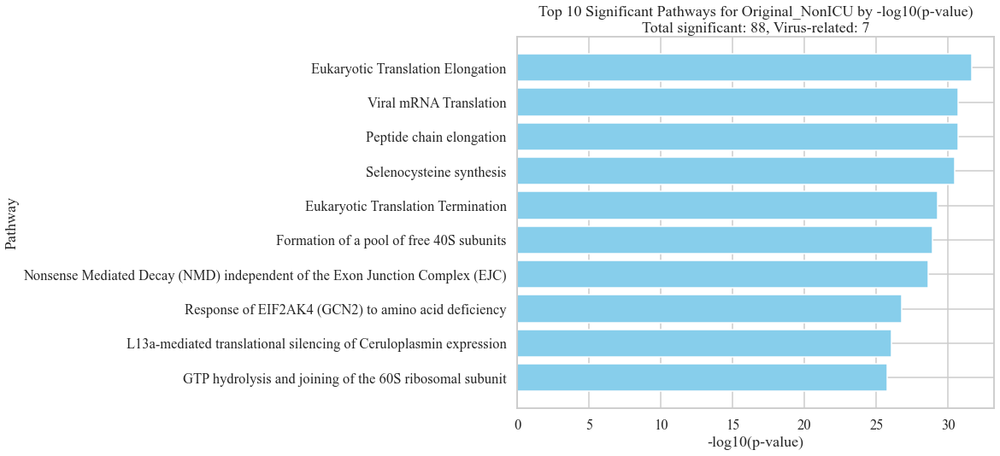

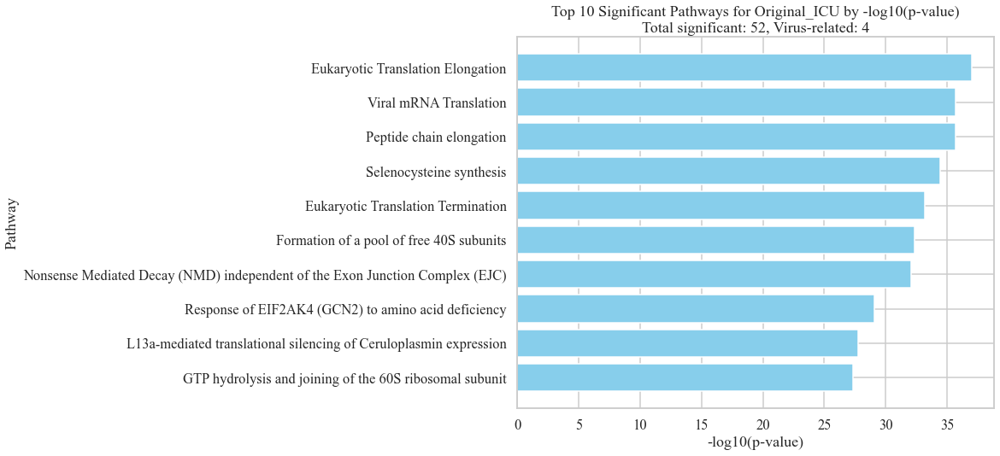

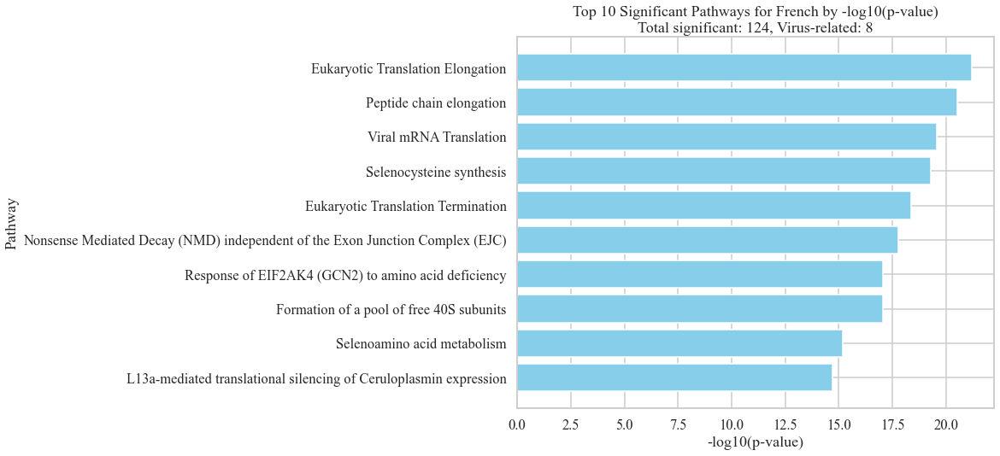

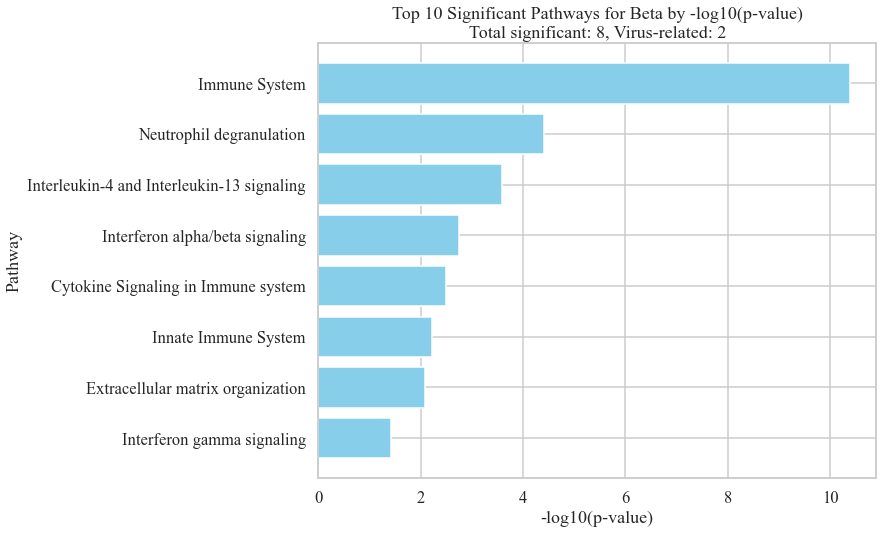

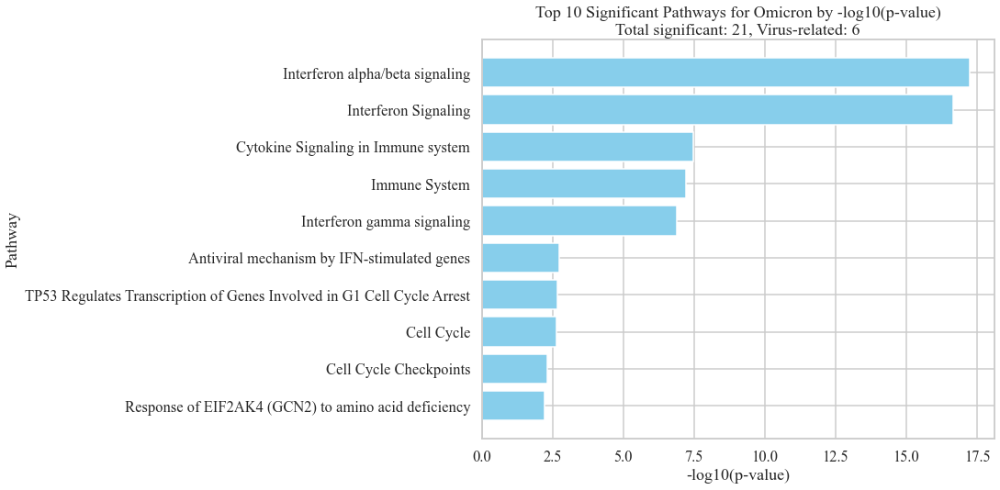

In [27]:
from gprofiler import GProfiler
import numpy as np
import matplotlib.pyplot as plt

dataframes = {
    "Original_NonICU": Original_NonICU,
    "Original_ICU": Original_ICU,
    "French": French,
    "Beta": Beta,
    "Omicron": Omicron
}

gp = GProfiler(return_dataframe=True)

for name, df in dataframes.items():
    gene_list = df['Gene Symbol'].tolist()
    pathway_results = gp.profile(organism='hsapiens', query=gene_list, sources=['REAC'])
    significant_pathways = pathway_results[pathway_results['significant'] == True]

    total_significant = len(significant_pathways)

    keywords = ['virus', 'infection', 'viral', 'immune response', 'antiviral', 'replication', 'interferon', 'cytokine storm']
    pattern = '|'.join(keywords)
    virus_related_pathways = significant_pathways[significant_pathways['name'].str.contains(pattern, case=False, regex=True)]
    count_virus_related = len(virus_related_pathways)

    top_10_pathways = significant_pathways.sort_values('p_value').head(10)
    top_10_pathways['negative_log_p'] = -np.log10(top_10_pathways['p_value'])

    plt.figure(figsize=(10, 8))
    plt.barh(top_10_pathways['name'], top_10_pathways['negative_log_p'], color='skyblue')
    plt.xlabel('-log10(p-value)')
    plt.ylabel('Pathway')
    plt.title(f'Top 10 Significant Pathways for {name} by -log10(p-value)\nTotal significant: {total_significant}, Virus-related: {count_virus_related}')
    plt.gca().invert_yaxis()
    plt.show()


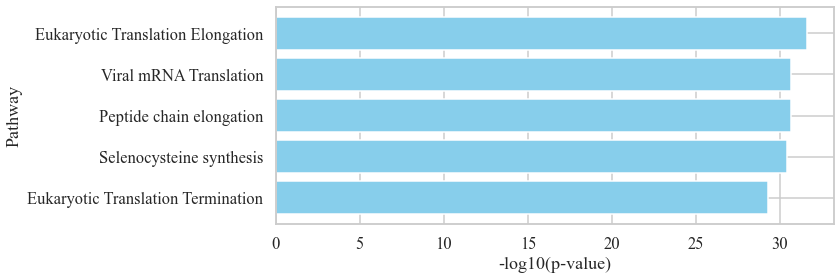

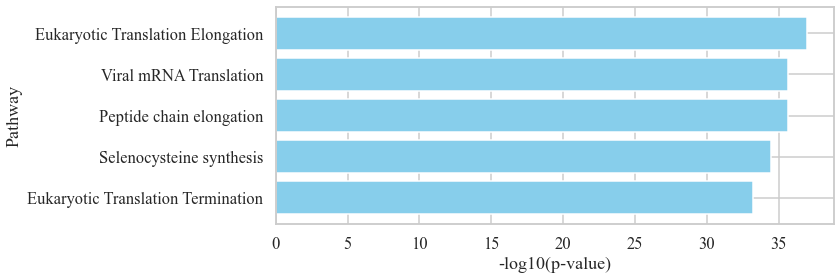

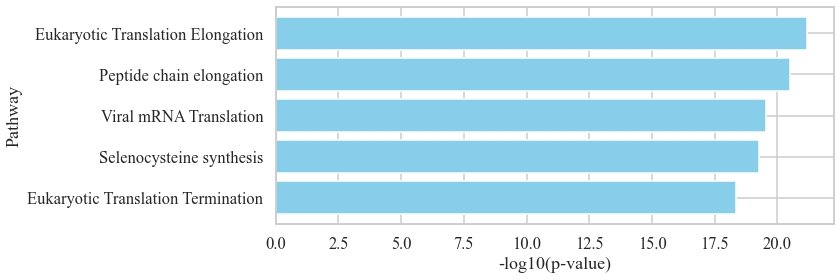

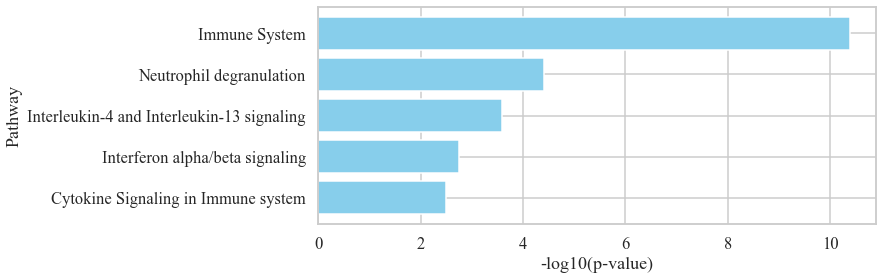

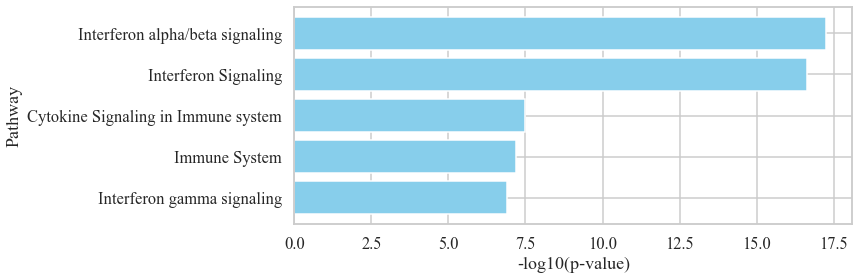

In [28]:
from gprofiler import GProfiler
import numpy as np
import matplotlib.pyplot as plt

dataframes = {
    "Original_NonICU": Original_NonICU,
    "Original_ICU": Original_ICU,
    "French": French,
    "Beta": Beta,
    "Omicron": Omicron
}

gp = GProfiler(return_dataframe=True)

for name, df in dataframes.items():
    gene_list = df['Gene Symbol'].tolist()
    pathway_results = gp.profile(organism='hsapiens', query=gene_list, sources=['REAC'])
    significant_pathways = pathway_results[pathway_results['significant'] == True]

    total_significant = len(significant_pathways)

    keywords = ['virus', 'infection', 'viral', 'immune response', 'antiviral', 'replication', 'interferon', 'cytokine storm']
    pattern = '|'.join(keywords)
    virus_related_pathways = significant_pathways[significant_pathways['name'].str.contains(pattern, case=False, regex=True)]
    count_virus_related = len(virus_related_pathways)

    top_10_pathways = significant_pathways.sort_values('p_value').head(5)
    top_10_pathways['negative_log_p'] = -np.log10(top_10_pathways['p_value'])

    if len(top_10_pathways) < 5:
        additional_rows = 5 - len(top_10_pathways)
        empty_data = pd.DataFrame({
            'name': ['' for _ in range(additional_rows)],
            'negative_log_p': [0 for _ in range(additional_rows)]
        })
        top_10_pathways = pd.concat([top_10_pathways, empty_data])

    plt.figure(figsize=(10, 4))
    plt.barh(top_10_pathways['name'], top_10_pathways['negative_log_p'], color='skyblue')
    plt.xlabel('-log10(p-value)')
    plt.ylabel('Pathway')
    plt.gca().invert_yaxis()
    plt.show()


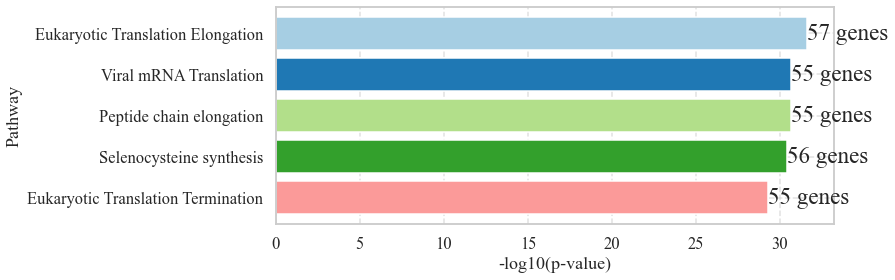

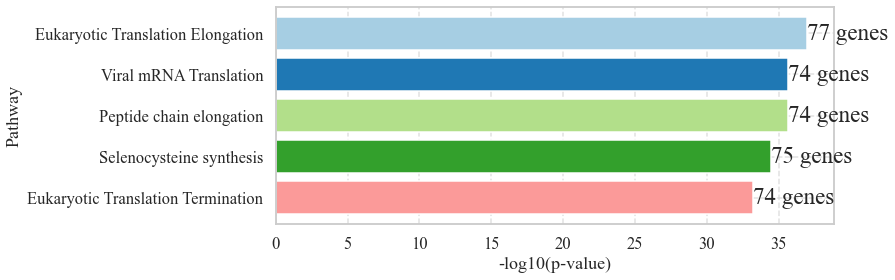

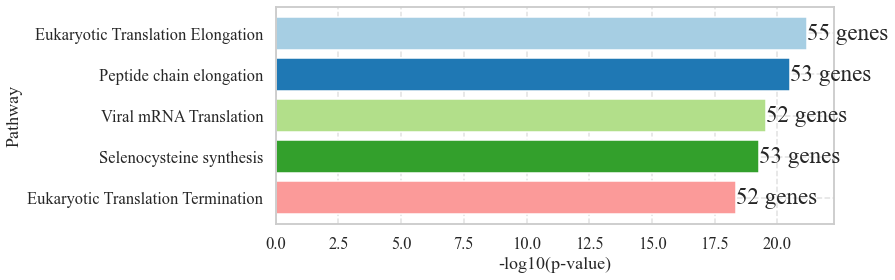

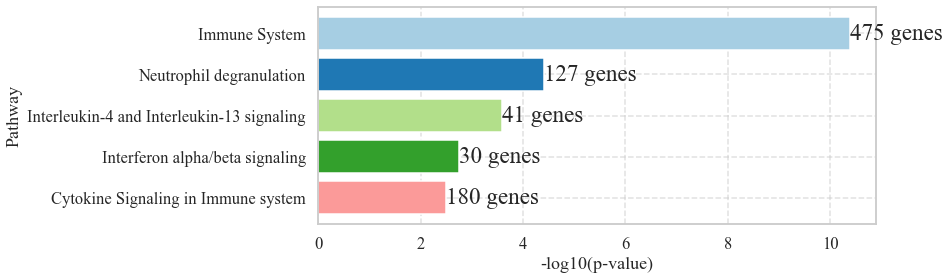

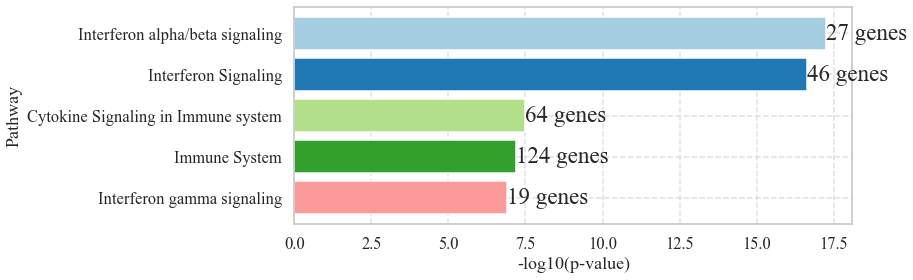

In [29]:
from gprofiler import GProfiler
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

dataframes = {
    "Original_NonICU": Original_NonICU,
    "Original_ICU": Original_ICU,
    "French": French,
    "Beta": Beta,
    "Omicron": Omicron
}

gp = GProfiler(return_dataframe=True)

for name, df in dataframes.items():
    gene_list = df['Gene Symbol'].tolist()
    pathway_results = gp.profile(organism='hsapiens', query=gene_list, sources=['REAC'])
    significant_pathways = pathway_results[pathway_results['significant'] == True]

    total_significant = len(significant_pathways)

    keywords = ['virus', 'infection', 'viral', 'immune response', 'antiviral', 'replication', 'interferon', 'cytokine storm']
    pattern = '|'.join(keywords)
    virus_related_pathways = significant_pathways[significant_pathways['name'].str.contains(pattern, case=False, regex=True)]
    count_virus_related = len(virus_related_pathways)

    top_5_pathways = significant_pathways.sort_values('p_value').head(5)
    top_5_pathways['negative_log_p'] = -np.log10(top_5_pathways['p_value'])

    if len(top_5_pathways) < 5:
        additional_rows = 5 - len(top_5_pathways)
        empty_data = pd.DataFrame({
            'name': ['' for _ in range(additional_rows)],
            'negative_log_p': [0 for _ in range(additional_rows)],
            'intersection_size': [0 for _ in range(additional_rows)]  
        })
        top_5_pathways = pd.concat([top_5_pathways, empty_data])

    plt.figure(figsize=(10, 4)) 
    bars = plt.barh(top_5_pathways['name'], top_5_pathways['negative_log_p'], color=plt.cm.Paired(np.arange(len(top_5_pathways))))
    plt.xlabel('-log10(p-value)')
    plt.ylabel('Pathway')
    plt.gca().invert_yaxis()
    plt.grid(True, linestyle='--', alpha=0.6)
    for bar, size in zip(bars, top_5_pathways['intersection_size']):
        plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{size} genes', va='center')
    plt.show()


In [30]:
from gprofiler import GProfiler
import numpy as np
import pandas as pd

dataframes = {
    "Original_NonICU": Original_NonICU,
    "Original_ICU": Original_ICU,
    "French": French,
    "Beta": Beta,
    "Omicron": Omicron
}

gp = GProfiler(return_dataframe=True)

for name, df in dataframes.items():
    gene_list = df['Gene Symbol'].tolist()
    pathway_results = gp.profile(organism='hsapiens', query=gene_list, sources=['REAC'])


    sig_pathways = pathway_results[pathway_results['significant'] == True].copy()


    sig_pathways['-log10(p-value)'] = -np.log10(sig_pathways['p_value'])


    top10 = sig_pathways.sort_values('p_value').head(10)


    top10_export = top10[['name', 'p_value', '-log10(p-value)', 'intersection_size', 'term_size', 'query_size']]
    top10_export.insert(0, 'Strain', name)


    top10_export.to_csv(f'REAC_Pathway_Results_{name}.csv', index=False)

    print(f"Saved: REAC_Pathway_Results_{name}.csv")


Saved: REAC_Pathway_Results_Original_NonICU.csv
Saved: REAC_Pathway_Results_Original_ICU.csv
Saved: REAC_Pathway_Results_French.csv
Saved: REAC_Pathway_Results_Beta.csv
Saved: REAC_Pathway_Results_Omicron.csv


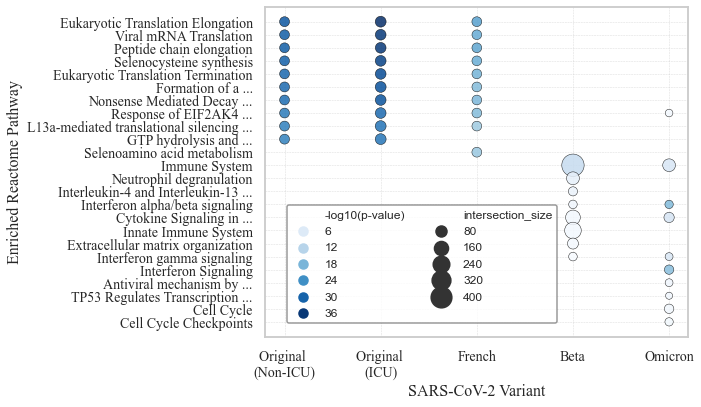

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

strain_files = {
    'Original_NonICU': 'Original \n(Non-ICU)',
    'Original_ICU': 'Original \n(ICU)',
    'French': 'French',
    'Beta': 'Beta',
    'Omicron': 'Omicron'
}

def shorten_label(text, max_words=3):
    words = str(text).split()
    if len(words) > max_words:
        return ' '.join(words[:max_words]) + ' ...'
    else:
        return ' '.join(words)

def load_saved_pathways(file_path, strain_label):
    df = pd.read_csv(file_path)
    df['Strain'] = strain_label
    df['name_short'] = df['name'].apply(shorten_label)
    return df[['Strain', 'name', 'name_short', '-log10(p-value)', 'intersection_size']]

top_all_pathways = []
for fname, label in strain_files.items():
    path = f'REAC_Pathway_Results_{fname}.csv'
    top_all_pathways.append(load_saved_pathways(path, label))

combined_df = pd.concat(top_all_pathways)

sns.set(style='whitegrid', context='talk')

plt.figure(figsize=(10, 6))
plot = sns.scatterplot(
    data=combined_df,
    x='Strain',
    y='name_short',
    size='intersection_size',
    hue='-log10(p-value)',
    palette='Blues',
    sizes=(50, 500),
    edgecolor='black',
    linewidth=0.5,
    alpha=0.85
)

plt.xticks(rotation=0, fontsize=14, family='Times New Roman')
plt.yticks(fontsize=14, family='Times New Roman')
plt.xlabel('SARS-CoV-2 Variant', fontsize=16, family='Times New Roman')
plt.ylabel('Enriched Reactome Pathway', fontsize=16, family='Times New Roman')

legend = plt.legend(
    fontsize=12,
    title_fontsize=16,
    loc='upper right',
    bbox_to_anchor=(0.69, 0.4),
    borderaxespad=0.,
    frameon=True,
    ncol=2
)
legend.get_frame().set_edgecolor('gray')

plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()


In [3]:
import gprofiler
import numpy
import pandas

print("gprofiler-official version:", gprofiler.__version__)
print("numpy version:", numpy.__version__)
print("pandas version:", pandas.__version__)


gprofiler-official version: 1.0.0
numpy version: 1.19.5
pandas version: 1.1.5


In [34]:
import pandas as pd

strain_files = {
    'Original_NonICU': 'Original (Non-ICU)',
    'Original_ICU': 'Original (ICU)',
    'French': 'French',
    'Beta': 'Beta',
    'Omicron': 'Omicron'
}

def wrap_label(text, words_per_line=3):
    words = str(text).split()
    if not words:
        return ''
    return '\n'.join([' '.join(words[i:i+words_per_line]) for i in range(0, len(words), words_per_line)])

for fname, label in strain_files.items():
    path = f'REAC_Pathway_Results_{fname}.csv'
    try:
        df = pd.read_csv(path)
        df['Strain'] = label
        df['name_wrapped'] = df['name'].apply(wrap_label)
        print(f"\nTop Reactome pathways for {label}:")
        print(df[['name_wrapped', '-log10(p-value)', 'intersection_size']].to_string(index=False))
    except FileNotFoundError:
        print(f"File not found: {path}")



Top Reactome pathways for Original (Non-ICU):
                                                                    name_wrapped  -log10(p-value)  intersection_size
                                               Eukaryotic Translation Elongation        31.619218                 57
                                                          Viral mRNA Translation        30.678448                 55
                                                        Peptide chain elongation        30.678448                 55
                                                        Selenocysteine synthesis        30.434502                 56
                                              Eukaryotic Translation Termination        29.269191                 55
                                      Formation of a\npool of free\n40S subunits        28.931093                 57
 Nonsense Mediated Decay\n(NMD) independent of\nthe Exon Junction\nComplex (EJC)        28.603970                 55
                 

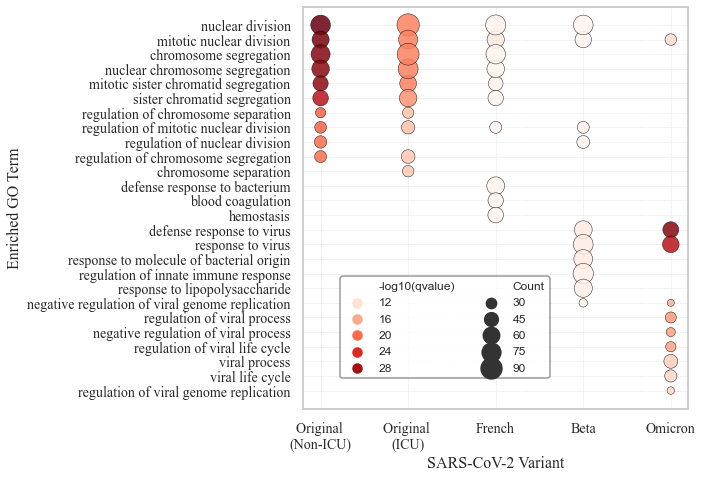

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def load_top_GO(file_path, strain_name, top_n=10):
    df = pd.read_csv(file_path)
    df = df[df['qvalue'] < 0.05].copy()
    df['-log10(qvalue)'] = -np.log10(df['qvalue'])
    df['Strain'] = strain_name
    df_top = df.sort_values(by='qvalue').head(top_n)
    return df_top

strain_files = {
    'GSE157103NonICU': 'Original \n(Non-ICU)',
    'GSE157103ICU': 'Original \n(ICU)',
    'GSE171110': 'French',
    'GSE189039': 'Beta',
    'GSE201530': 'Omicron'
}

top_all_df = []
for fname, label in strain_files.items():
    path = f'GO_Upregulated_BH_Mock_vs_{fname}.csv'
    top_all_df.append(load_top_GO(path, label, top_n=10))

combined_df = pd.concat(top_all_df)

sns.set(style='whitegrid', context='talk')

plt.figure(figsize=(10, 7))
plot = sns.scatterplot(
    data=combined_df,
    x='Strain',
    y='Description',
    size='Count',
    hue='-log10(qvalue)',
    palette='Reds',
    sizes=(50, 500),
    edgecolor='black',
    linewidth=0.5,
    alpha=0.85
)

plt.xticks(rotation=0, fontsize=14, family='Times New Roman')
plt.yticks(fontsize=14, family='Times New Roman')
plt.xlabel('SARS-CoV-2 Variant', fontsize=16, family='Times New Roman')
plt.ylabel('Enriched GO Term', fontsize=16, family='Times New Roman')

legend = plt.legend(
    fontsize=12,
    title_fontsize=16,
    loc='upper right',
    bbox_to_anchor=(0.64, 0.33),
    borderaxespad=0.,
    frameon=True,
    ncol=2
)
legend.get_frame().set_edgecolor('gray')

plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()


In [36]:

concatenated_list=['RRM2',
 'HJURP',
 'CDC45',
 'CDC25A',
 'E2F8',
 'BIRC5',
 'CKAP2L',
 'CDCA2',
 'SPC25',
 'DLGAP5',
 'ANLN',
 'KIF4A',
 'KIF14',
 'SLC1A3',
 'KIF18B',
 'IFI27',
 'CDCA5',
 'CLSPN',
 'MELK',
 'DIAPH3',
 'CENPA',
 'BUB1',
 'CCNA1',
 'CDC20',
 'CEP55',
 'NEK2',
 'ESPL1',
 'TCN1',
 'SKA1',
 'TARM1',
 'CACNG6',
 'RPL3',
 'RPS17',
 'RPS23',
 'PMP22',
 'CACNG8',
 'KLRB1']


In [37]:
import matplotlib.pyplot as plt

plt.rcParams['font.size'] = 14
plt.rcParams['font.family'] = 'Times New Roman'


plt.rcdefaults()


Filtered Genes: ['DIAPH3', 'SKA1', 'NEK2', 'RPS17', 'CEP55', 'SPC25', 'CDC20', 'BIRC5', 'HJURP', 'CDCA2', 'DLGAP5', 'CDCA5', 'CENPA', 'CDC25A', 'BUB1', 'ESPL1', 'CLSPN', 'ANLN', 'MELK', 'KIF18B', 'IFI27', 'RPL3', 'RPS23', 'RRM2', 'CKAP2L', 'CCNA1', 'KIF14', 'CDC45', 'KIF4A', 'E2F8']


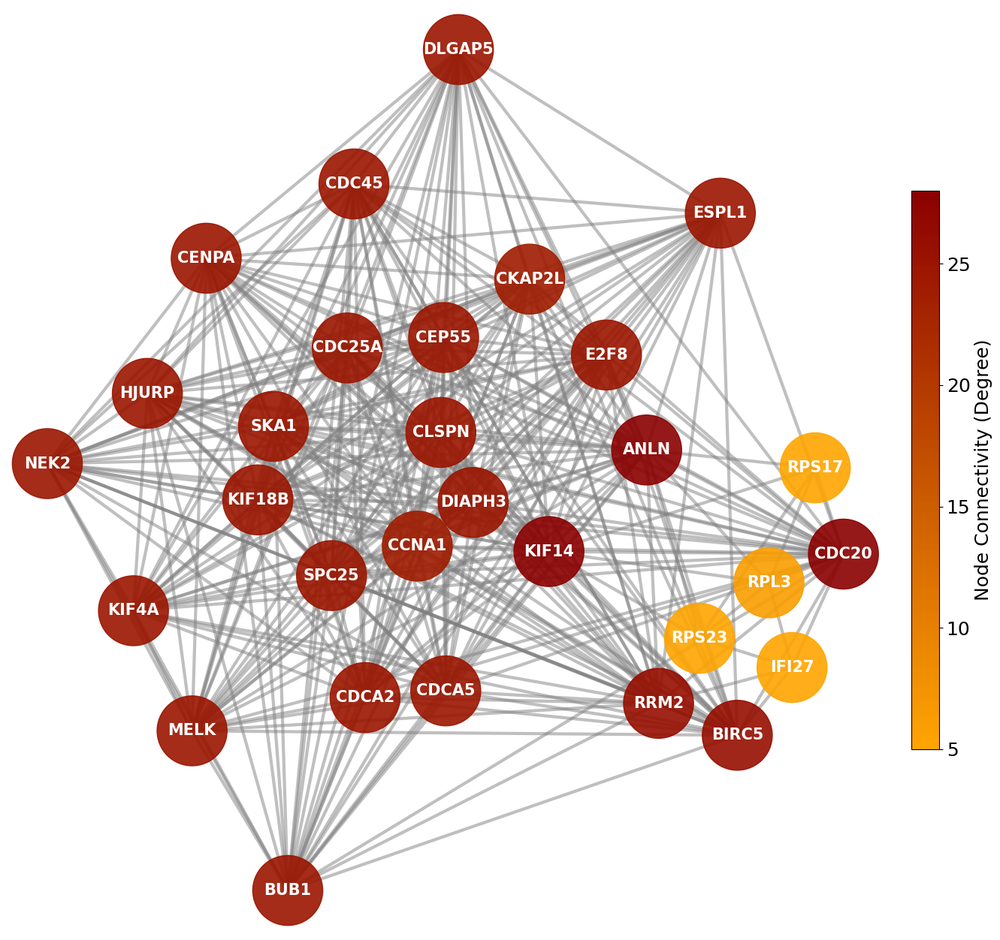

In [39]:
import requests
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

selected_genes = concatenated_list

string_api_url = "https://string-db.org/api/json/network"
params = {
    "identifiers": "%0d".join(selected_genes),  
    "species": 9606,  # Homo sapiens
    "required_score":100, 
    "network_flavor": "confidence"
}

response = requests.get(string_api_url, params=params)

if response.status_code == 200:
    interactions = response.json()
    
    G = nx.Graph()

    for interaction in interactions:
        p1 = interaction["preferredName_A"]
        p2 = interaction["preferredName_B"]
        score = interaction["score"]  
        G.add_edge(p1, p2, weight=score)

    filtered_nodes = {node for node, degree in G.degree() if degree >= 5}
    G_filtered = G.subgraph(filtered_nodes).copy()

    filtered_genes_list = list(filtered_nodes)
    print("Filtered Genes:", filtered_genes_list)

    pos = nx.kamada_kawai_layout(G_filtered)

    degrees = dict(G_filtered.degree())
    node_color = [degrees[node] for node in G_filtered.nodes()]
    
    colors = ["orange", "darkred"]
    custom_cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", colors)
    norm = plt.Normalize(vmin=min(node_color), vmax=max(node_color))

    fig, ax = plt.subplots(figsize=(16, 16))
    nodes = nx.draw_networkx_nodes(G_filtered, pos, node_color=node_color, cmap=custom_cmap, node_size=4500, alpha=0.9, ax=ax)
    edges = nx.draw_networkx_edges(G_filtered, pos, alpha=0.5, width=3, edge_color='gray', ax=ax)
    labels = nx.draw_networkx_labels(G_filtered, pos, font_size=15, font_weight='bold', font_color="white", ax=ax)

    sm = plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm)
    sm.set_array([])
    
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.03)  
    cbar.set_label("Node Connectivity (Degree)", size=18) 
    cbar.ax.tick_params(labelsize=18)

    ax.axis("off")
    plt.show()

else:
    print("Error: Unable to retrieve PPI data from STRING.")


In [1]:
import requests
import networkx as nx
import matplotlib
import numpy as np

print("requests version:", requests.__version__)
print("networkx version:", nx.__version__)
print("matplotlib version:", matplotlib.__version__)
print("numpy version:", np.__version__)


requests version: 2.27.1
networkx version: 2.5.1
matplotlib version: 3.3.4
numpy version: 1.19.5


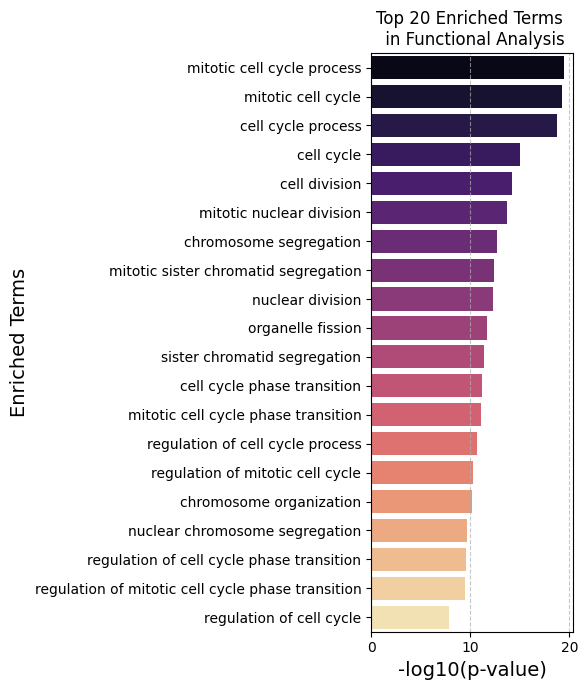

In [40]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from gprofiler import GProfiler

def functional_enrichment(genes):
    gp = GProfiler(return_dataframe=True)
    results = gp.profile(organism="hsapiens", query=genes)
    return results

enrichment_results = functional_enrichment(concatenated_list)

enrichment_results["-log10(p_value)"] = -np.log10(enrichment_results["p_value"])

top_enriched = enrichment_results.nlargest(20, "-log10(p_value)").sort_values("-log10(p_value)", ascending=False)

plt.figure(figsize=(6, 7))
sns.barplot(
    y=top_enriched["name"],  
    x=top_enriched["-log10(p_value)"],
    palette="magma"
)

plt.xlabel("-log10(p-value)", fontsize=14)
plt.ylabel("Enriched Terms", fontsize=14)
plt.title("Top 20 Enriched Terms \n in Functional Analysis", fontsize=12)
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


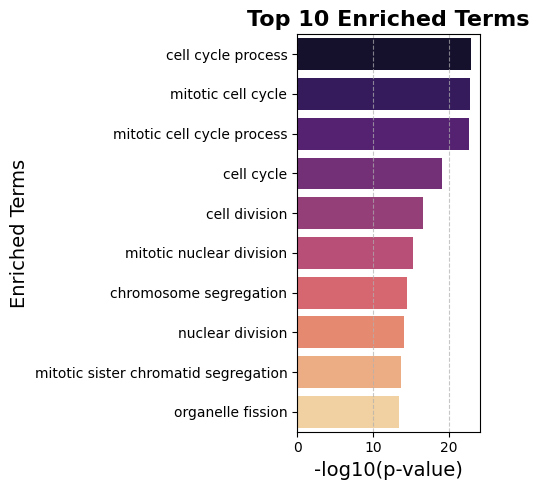

In [41]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from gprofiler import GProfiler

def functional_enrichment(genes):
    gp = GProfiler(return_dataframe=True)
    results = gp.profile(organism="hsapiens", query=genes)
    return results

enrichment_results = functional_enrichment(filtered_genes_list)

enrichment_results["-log10(p_value)"] = -np.log10(enrichment_results["p_value"])

top_enriched = enrichment_results.nlargest(10, "-log10(p_value)").sort_values("-log10(p_value)", ascending=False)

plt.figure(figsize=(5, 5))
sns.barplot(
    y=top_enriched["name"],  
    x=top_enriched["-log10(p_value)"],
    palette="magma"
)

plt.xlabel("-log10(p-value)", fontsize=14)
plt.ylabel("Enriched Terms", fontsize=14)
plt.title("Top 10 Enriched Terms", fontsize=16, fontweight="bold")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


In [4]:
import pkg_resources

ppi_related_packages = [
    "requests",
    "gprofiler-official",
    "networkx",
    "matplotlib"
]

for pkg in ppi_related_packages:
    try:
        version = pkg_resources.get_distribution(pkg).version
        print(f"{pkg} version: {version}")
    except pkg_resources.DistributionNotFound:
        print(f"{pkg} is not installed.")


requests version: 2.27.1
gprofiler-official version: 1.0.0
networkx version: 2.5.1
matplotlib version: 3.3.4
